In [ ]:
import tensorflow as tf

tf.keras.utils.set_random_seed(42)
tf.config.experimental.enable_op_determinism()

# 필요한 라이브러리 로드
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
# 텐서플로우 라이브러리에서 케라스 패키지 불러오기
from tensorflow import keras

# 심층 신경망 - 최종 점검 문제

## 와인데이터 - 이진분류

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/wine.csv', header = None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       6497 non-null   float64
 1   1       6497 non-null   float64
 2   2       6497 non-null   float64
 3   3       6497 non-null   float64
 4   4       6497 non-null   float64
 5   5       6497 non-null   float64
 6   6       6497 non-null   float64
 7   7       6497 non-null   float64
 8   8       6497 non-null   float64
 9   9       6497 non-null   float64
 10  10      6497 non-null   float64
 11  11      6497 non-null   int64  
 12  12      6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,6497.0,7.215307,1.296434,3.80000,6.40000,7.00000,7.70000,15.90000
1,6497.0,0.339666,0.164636,0.08000,0.23000,0.29000,0.40000,1.58000
2,6497.0,0.318633,0.145318,0.00000,0.25000,0.31000,0.39000,1.66000
3,6497.0,5.443235,4.757804,0.60000,1.80000,3.00000,8.10000,65.80000
4,6497.0,0.056034,0.035034,0.00900,0.03800,0.04700,0.06500,0.61100
5,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
6,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
7,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
8,6497.0,3.218501,0.160787,2.72000,3.11000,3.21000,3.32000,4.01000
9,6497.0,0.531268,0.148806,0.22000,0.43000,0.51000,0.60000,2.00000


In [ ]:
df[12].unique()

array([1, 0])

In [ ]:
df[12].value_counts()

12
0    4898
1    1599
Name: count, dtype: int64

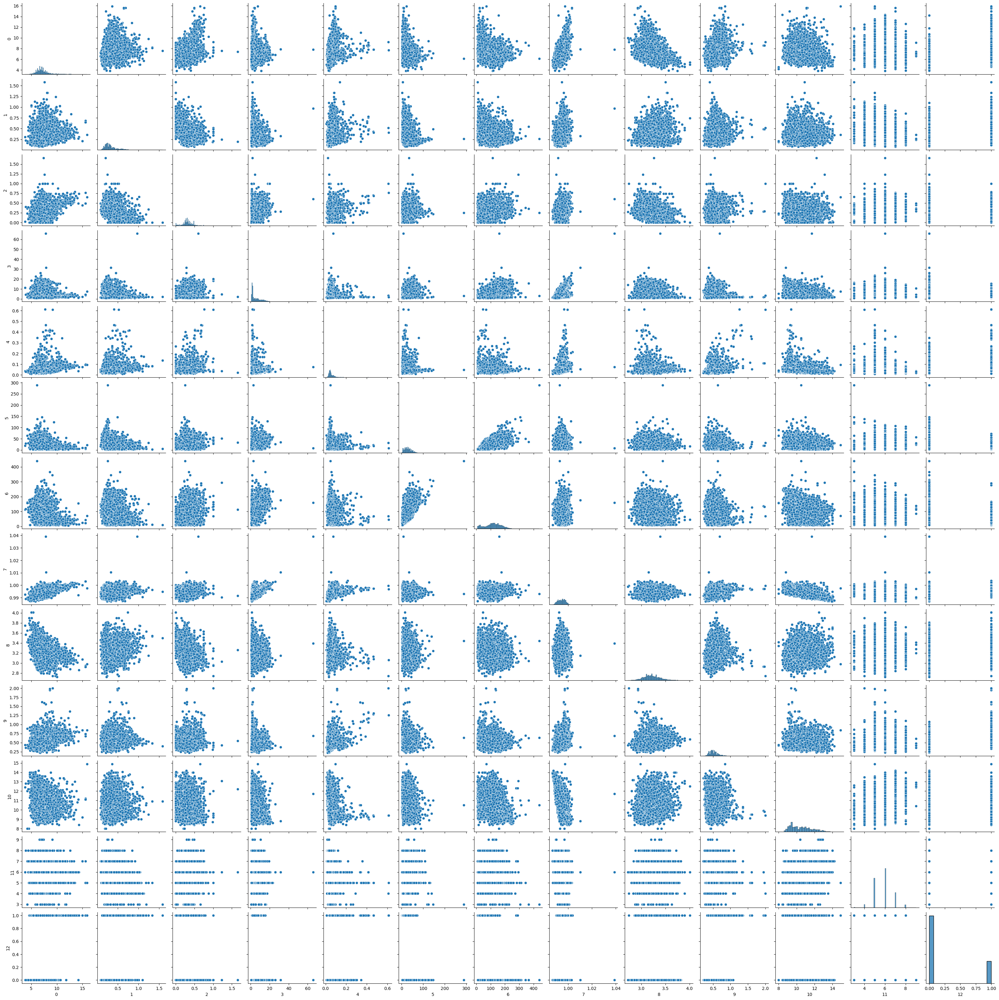

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], dtype='int64')

In [ ]:
# 데이터 분할
# 전체 데이터
X = df.drop([12], axis = 1).values
y = df[12].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (6497, 12)
y 데이터:  (6497,)


In [ ]:
# 데이터 분할 = 훈련 데이터 / 테스트 데이터
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state = 42)
print("train 데이터: ", X_train.shape)
print("test 데이터: ", X_test.shape)

train 데이터:  (5197, 12)
test 데이터:  (1300, 12)


In [ ]:
# 표준화(z점수)
from sklearn.preprocessing import StandardScaler
standard = StandardScaler()
standard.fit(X_train)
X_train_scale = standard.transform(X_train)
X_test_scale = standard.transform(X_test)
print(X_train_scale[:5])
print(X_test_scale[:5])

[[-0.46822898 -0.59951186  0.20546655  0.4646116  -0.71280142  0.31165933
   0.34356569 -0.29614553 -0.16888369 -1.0832659   0.01376574 -0.92920628]
 [ 0.85149992 -0.35284877  1.10406349 -0.70299854  1.06747    -1.4087346
  -1.84751841 -0.20307163  0.26967864  0.59857677  1.60871671  1.35243087]
 [ 0.38571325  2.32961232 -2.14471006 -0.70299854  0.2347624   0.02492701
  -1.29529396 -0.32606213  1.20945505  0.26220824  1.10504798  0.2116123 ]
 [-1.55506455  0.20214318  0.06722087 -0.89065017 -0.79894359 -1.00730935
  -0.61837367 -1.49280991  0.958848   -1.01599219  1.0211032   0.2116123 ]
 [-0.46822898 -0.47618032  1.65704622  2.07007555 -0.0810922   0.08227347
   0.45044784  1.1332036  -0.67009777 -0.27598142 -0.99357172 -0.92920628]]
[[-0.15770453 -1.03117227  2.90125736  1.52797084 -0.31080465 -0.37649824
   0.18324246 -0.16318282  0.26967864 -1.01599219  1.44082714  2.49324945]
 [ 0.38571325  1.86711903 -0.76225323 -0.68214836  0.60804512  0.08227347
   0.3079383   0.30218667  0.332

### 심층신경망 모델

In [ ]:
X_train_scale.shape[1]

12

In [ ]:
# 심층신경망 모델
model = keras.Sequential()
model.add(keras.layers.Dense(30, activation = 'relu', input_shape = (X_train_scale.shape[1], )))
model.add(keras.layers.Dense(12, activation = 'relu'))
model.add(keras.layers.Dense(8, activation = 'relu'))
model.add(keras.layers.Dense(1, activation = 'sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 30)                390       
                                                                 
 dense_1 (Dense)             (None, 12)                372       
                                                                 
 dense_2 (Dense)             (None, 8)                 104       
                                                                 
 dense_3 (Dense)             (None, 1)                 9         
                                                                 
Total params: 875 (3.42 KB)
Trainable params: 875 (3.42 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'binary_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_model.h5',
                                                verbose = 1,
                                                save_best_only=True)
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 100)

In [ ]:
history = model.fit(X_train_scale, y_train, epochs = 3500, batch_size = 500,
                    validation_split = 0.2, verbose = 0,
                    callbacks = [checkpoint_cb, early_stopping_cb])


Epoch 1: val_loss improved from inf to 0.77131, saving model to ./best_model.h5

Epoch 2: val_loss improved from 0.77131 to 0.71859, saving model to ./best_model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(



Epoch 3: val_loss improved from 0.71859 to 0.68186, saving model to ./best_model.h5

Epoch 4: val_loss improved from 0.68186 to 0.65202, saving model to ./best_model.h5

Epoch 5: val_loss improved from 0.65202 to 0.62684, saving model to ./best_model.h5

Epoch 6: val_loss improved from 0.62684 to 0.60482, saving model to ./best_model.h5

Epoch 7: val_loss improved from 0.60482 to 0.58547, saving model to ./best_model.h5

Epoch 8: val_loss improved from 0.58547 to 0.56869, saving model to ./best_model.h5

Epoch 9: val_loss improved from 0.56869 to 0.55419, saving model to ./best_model.h5

Epoch 10: val_loss improved from 0.55419 to 0.54193, saving model to ./best_model.h5

Epoch 11: val_loss improved from 0.54193 to 0.53150, saving model to ./best_model.h5

Epoch 12: val_loss improved from 0.53150 to 0.52187, saving model to ./best_model.h5

Epoch 13: val_loss improved from 0.52187 to 0.51227, saving model to ./best_model.h5

Epoch 14: val_loss improved from 0.51227 to 0.50163, saving 

In [ ]:
print(early_stopping_cb.stopped_epoch)

241


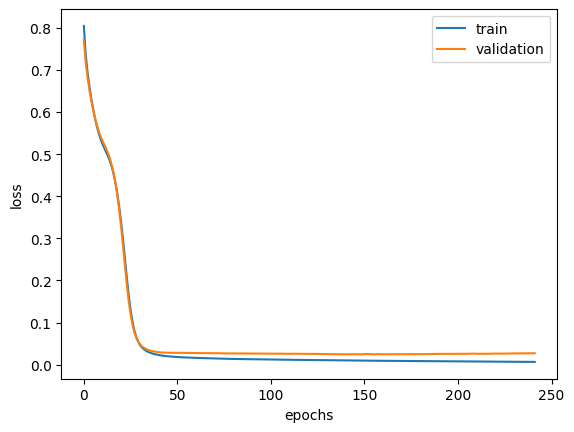

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
141,0.009905,0.998316,0.02446,0.997115


In [ ]:
# 최적의 에포크
opt_epoch = early_stopping_cb.stopped_epoch - 100 + 1

In [ ]:
# 심층신경망 모델
model = keras.Sequential()
model.add(keras.layers.Dense(30, activation = 'relu', input_shape = (X_train_scale.shape[1], )))
model.add(keras.layers.Dense(12, activation = 'relu'))
model.add(keras.layers.Dense(8, activation = 'relu'))
model.add(keras.layers.Dense(1, activation = 'sigmoid'))

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'binary_crossentropy', metrics = 'accuracy')
history = model.fit(X_train_scale, y_train, epochs = opt_epoch, batch_size = 500, verbose = 0)

In [ ]:
model.evaluate(X_test_scale, y_test)

41/41 [==============================] - 0s 2ms/step - loss: 0.0272 - accuracy: 0.9954


[0.027166401967406273, 0.9953846335411072]

In [ ]:
y_test_pred = model.predict(X_test_scale).flatten()

41/41 [==============================] - 0s 2ms/step


In [ ]:
y_test_bin = [round(x) for x in y_test_pred]

In [ ]:
np.mean(y_test == y_test_bin)

0.9953846153846154

## 집값 예측 문제

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/house_price.csv', header = None,
            delim_whitespace = True)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       506 non-null    float64
 1   1       506 non-null    float64
 2   2       506 non-null    float64
 3   3       506 non-null    int64  
 4   4       506 non-null    float64
 5   5       506 non-null    float64
 6   6       506 non-null    float64
 7   7       506 non-null    float64
 8   8       506 non-null    int64  
 9   9       506 non-null    float64
 10  10      506 non-null    float64
 11  11      506 non-null    float64
 12  12      506 non-null    float64
 13  13      506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,506.0,3.613524,8.601545,0.00632,0.082045,0.25651,3.677083,88.9762
1,506.0,11.363636,23.322453,0.00000,0.000000,0.00000,12.500000,100.0000
2,506.0,11.136779,6.860353,0.46000,5.190000,9.69000,18.100000,27.7400
3,506.0,0.069170,0.253994,0.00000,0.000000,0.00000,0.000000,1.0000
4,506.0,0.554695,0.115878,0.38500,0.449000,0.53800,0.624000,0.8710
5,506.0,6.284634,0.702617,3.56100,5.885500,6.20850,6.623500,8.7800
6,506.0,68.574901,28.148861,2.90000,45.025000,77.50000,94.075000,100.0000
7,506.0,3.795043,2.105710,1.12960,2.100175,3.20745,5.188425,12.1265
8,506.0,9.549407,8.707259,1.00000,4.000000,5.00000,24.000000,24.0000
9,506.0,408.237154,168.537116,187.00000,279.000000,330.00000,666.000000,711.0000


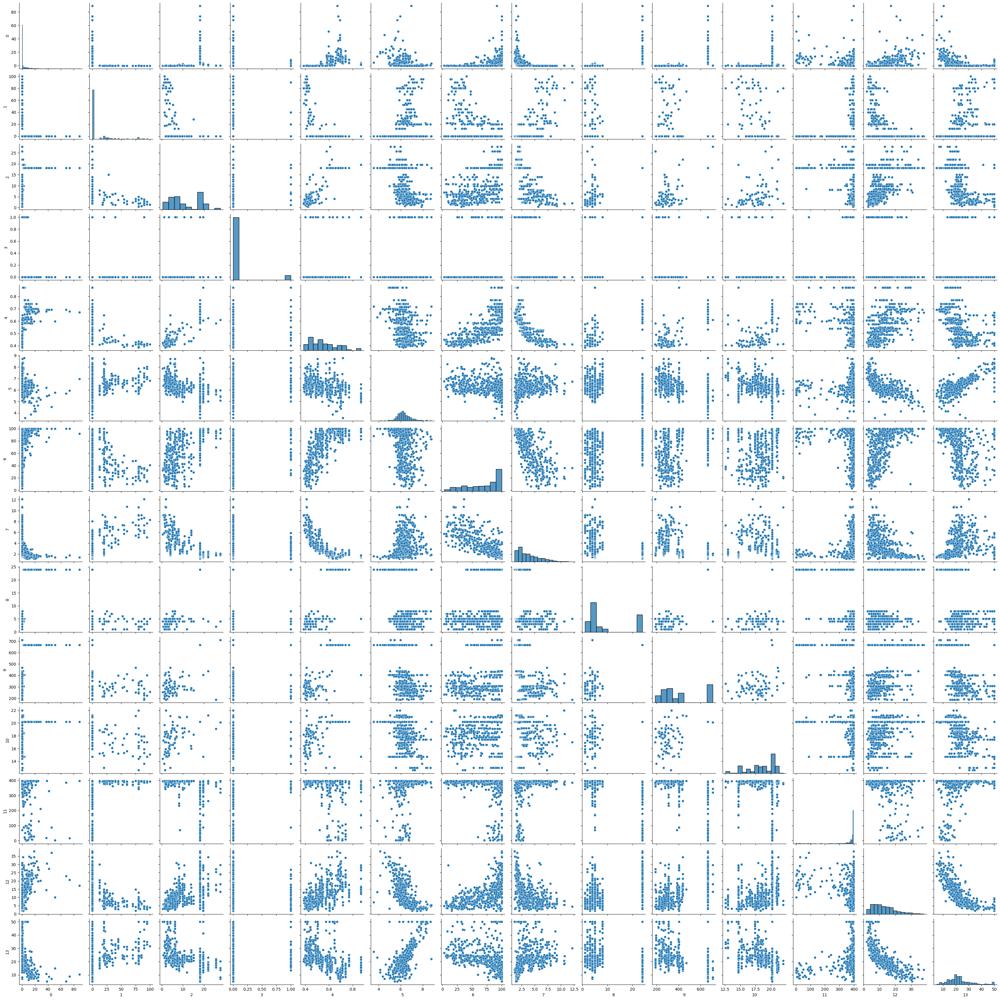

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], dtype='int64')

In [ ]:
# 데이터 분할
# 전체 데이터
X = df.drop([13], axis = 1).values
y = df[13].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (506, 13)
y 데이터:  (506,)


In [ ]:
# 데이터 분할 = 훈련 데이터 / 테스트 데이터
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3,
                                                    random_state = 42)
print("train 데이터: ", X_train.shape)
print("test 데이터: ", X_test.shape)

train 데이터:  (354, 13)
test 데이터:  (152, 13)


In [ ]:
# 표준화(z점수)
from sklearn.preprocessing import StandardScaler
standard = StandardScaler()
standard.fit(X_train)
X_train_scale = standard.transform(X_train)
X_test_scale = standard.transform(X_test)
print(X_train_scale[:5])
print(X_test_scale[:5])

[[-0.41425879 -0.50512499 -1.29214218 -0.28154625 -0.85108479  0.14526384
  -0.365584    1.08162833 -0.74617905 -1.11279004  0.18727079  0.39651419
  -1.01531611]
 [-0.40200818 -0.50512499 -0.16208345 -0.28154625 -0.08796708 -0.20840082
   0.13394078 -0.48787608 -0.39846419  0.15008778 -0.21208981  0.3870674
  -0.05366252]
 [-0.39721053 -0.50512499 -0.60948856 -0.28154625 -0.93682836 -0.89623682
  -1.26690045  0.62859591 -0.74617905 -1.0466393  -0.16771641  0.42854113
  -0.31132373]
 [-0.29093623 -0.50512499 -0.43196976 -0.28154625 -0.16513629 -0.54396454
  -1.42978896  0.3451327  -0.6302741  -0.60162521  1.20785901  0.31276028
  -0.82242219]
 [ 1.45781561 -0.50512499  1.00549958 -0.28154625  0.19498668 -0.55649596
   0.07964461 -0.40389221  1.68782492  1.5572945   0.8528718   0.10412434
   0.8038002 ]]
[[-0.406801   -0.50512499 -1.02225586 -0.28154625 -0.40521827  0.12577051
   0.55383118 -0.52734802 -0.51436915 -0.66777595 -0.74457062  0.41241246
  -0.47605794]
 [-0.41105674  1.26662

### 심층신경망 모델

In [ ]:
X_train_scale.shape[1]

13

In [ ]:
# 심층신경망 모델
model = keras.Sequential()
model.add(keras.layers.Dense(30, activation = 'relu', input_shape = (X_train_scale.shape[1],)))
model.add(keras.layers.Dense(6, activation = 'relu'))
model.add(keras.layers.Dense(1))

In [ ]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_8 (Dense)             (None, 30)                420       
                                                                 
 dense_9 (Dense)             (None, 6)                 186       
                                                                 
 dense_10 (Dense)            (None, 1)                 7         
                                                                 
Total params: 613 (2.39 KB)
Trainable params: 613 (2.39 KB)
Non-trainable params: 0 (0.00 Byte)
_________________________________________________________________


In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'mse')
history = model.fit(X_train_scale, y_train, epochs = 200, batch_size = 10,
                    validation_split = 0.2)

Epoch 1/200
29/29 [==============================] - 1s 8ms/step - loss: 596.0042 - val_loss: 542.2905
Epoch 2/200
29/29 [==============================] - 0s 3ms/step - loss: 557.0350 - val_loss: 491.9131
Epoch 3/200
29/29 [==============================] - 0s 3ms/step - loss: 489.6189 - val_loss: 417.5114
Epoch 4/200
29/29 [==============================] - 0s 4ms/step - loss: 393.9712 - val_loss: 319.4424
Epoch 5/200
29/29 [==============================] - 0s 3ms/step - loss: 279.6588 - val_loss: 214.0504
Epoch 6/200
29/29 [==============================] - 0s 3ms/step - loss: 171.7805 - val_loss: 124.4539
Epoch 7/200
29/29 [==============================] - 0s 3ms/step - loss: 98.7719 - val_loss: 73.6224
Epoch 8/200
29/29 [==============================] - 0s 3ms/step - loss: 63.6912 - val_loss: 55.1258
Epoch 9/200
29/29 [==============================] - 0s 3ms/step - loss: 48.7102 - val_loss: 47.6318
Epoch 10/200
29/29 [==============================] - 0s 3ms/step - loss: 40.12

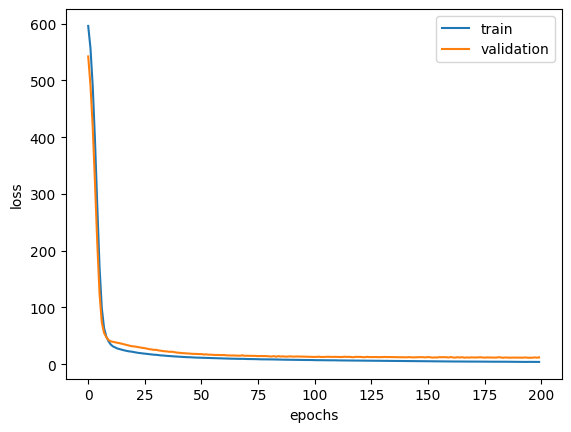

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,val_loss
183,4.291743,11.326468


In [ ]:
opt_epoch = history_df[history_df['val_loss'] == min(history_df['val_loss'])].index[0]
opt_epoch = opt_epoch + 1

In [ ]:
# 심층신경망 모델
model = keras.Sequential()
model.add(keras.layers.Dense(30, activation = 'relu', input_shape = (X_train_scale.shape[1],)))
model.add(keras.layers.Dense(6, activation = 'relu'))
model.add(keras.layers.Dense(1))

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'mse')
history = model.fit(X_train_scale, y_train, epochs = opt_epoch, batch_size = 10)

Epoch 1/184
36/36 [==============================] - 1s 2ms/step - loss: 583.3064
Epoch 2/184
36/36 [==============================] - 0s 2ms/step - loss: 520.0748
Epoch 3/184
36/36 [==============================] - 0s 2ms/step - loss: 431.7351
Epoch 4/184
36/36 [==============================] - 0s 2ms/step - loss: 323.1169
Epoch 5/184
36/36 [==============================] - 0s 2ms/step - loss: 213.2856
Epoch 6/184
36/36 [==============================] - 0s 2ms/step - loss: 136.6059
Epoch 7/184
36/36 [==============================] - 0s 2ms/step - loss: 91.9080
Epoch 8/184
36/36 [==============================] - 0s 2ms/step - loss: 66.7841
Epoch 9/184
36/36 [==============================] - 0s 2ms/step - loss: 53.3054
Epoch 10/184
36/36 [==============================] - 0s 2ms/step - loss: 44.9142
Epoch 11/184
36/36 [==============================] - 0s 2ms/step - loss: 40.3133
Epoch 12/184
36/36 [==============================] - 0s 2ms/step - loss: 36.9428
Epoch 13/184
36/36 

In [ ]:
model.evaluate(X_test_scale, y_test)

5/5 [==============================] - 0s 3ms/step - loss: 11.0228


11.02284049987793

In [ ]:
# 예측
y_test_pred = model.predict(X_test_scale).flatten()

5/5 [==============================] - 0s 4ms/step


In [ ]:
y_test

array([23.6, 32.4, 13.6, 22.8, 16.1, 20. , 17.8, 14. , 19.6, 16.8, 21.5,
       18.9,  7. , 21.2, 18.5, 29.8, 18.8, 10.2, 50. , 14.1, 25.2, 29.1,
       12.7, 22.4, 14.2, 13.8, 20.3, 14.9, 21.7, 18.3, 23.1, 23.8, 15. ,
       20.8, 19.1, 19.4, 34.7, 19.5, 24.4, 23.4, 19.7, 28.2, 50. , 17.4,
       22.6, 15.1, 13.1, 24.2, 19.9, 24. , 18.9, 35.4, 15.2, 26.5, 43.5,
       21.2, 18.4, 28.5, 23.9, 18.5, 25. , 35.4, 31.5, 20.2, 24.1, 20. ,
       13.1, 24.8, 30.8, 12.7, 20. , 23.7, 10.8, 20.6, 20.8,  5. , 20.1,
       48.5, 10.9,  7. , 20.9, 17.2, 20.9,  9.7, 19.4, 29. , 16.4, 25. ,
       25. , 17.1, 23.2, 10.4, 19.6, 17.2, 27.5, 23. , 50. , 17.9,  9.6,
       17.2, 22.5, 21.4, 12. , 19.9, 19.4, 13.4, 18.2, 24.6, 21.1, 24.7,
        8.7, 27.5, 20.7, 36.2, 31.6, 11.7, 39.8, 13.9, 21.8, 23.7, 17.6,
       24.4,  8.8, 19.2, 25.3, 20.4, 23.1, 37.9, 15.6, 45.4, 15.7, 22.6,
       14.5, 18.7, 17.8, 16.1, 20.6, 31.6, 29.1, 15.6, 17.5, 22.5, 19.4,
       19.3,  8.5, 20.6, 17. , 17.1, 14.5, 50. , 14

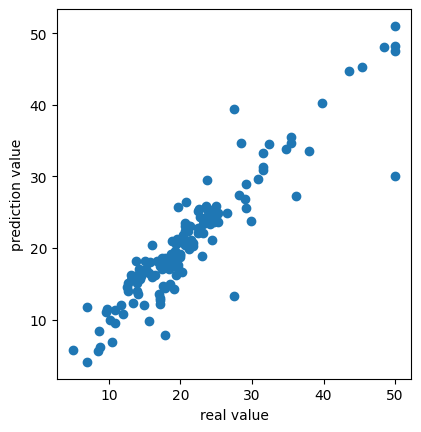

In [ ]:
plt.axes(aspect = 'equal')
plt.scatter(y_test, y_test_pred)
plt.xlabel('real value')
plt.ylabel('prediction value')
plt.show()

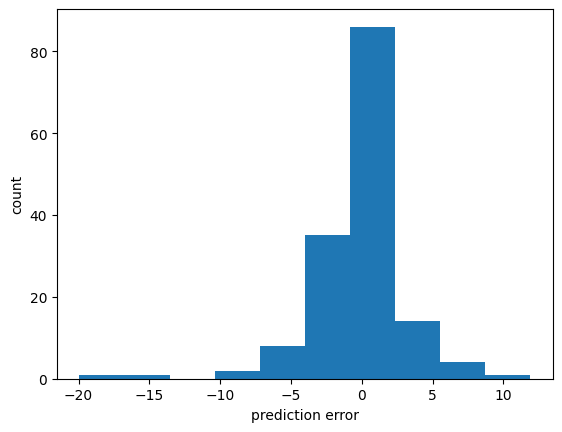

In [ ]:
error = y_test_pred - y_test
plt.hist(error)
plt.xlabel('prediction error')
plt.ylabel('count')
plt.show()

# 1차원 합성곱 신경망

## iris 데이터

In [ ]:
df = sns.load_dataset('iris')
df.head()

,sepal_length,sepal_width,petal_length,petal_width,species
0,5.1,3.5,1.4,0.2,setosa
1,4.9,3.0,1.4,0.2,setosa
2,4.7,3.2,1.3,0.2,setosa
3,4.6,3.1,1.5,0.2,setosa
4,5.0,3.6,1.4,0.2,setosa


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 150 entries, 0 to 149
Data columns (total 5 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   sepal_length  150 non-null    float64
 1   sepal_width   150 non-null    float64
 2   petal_length  150 non-null    float64
 3   petal_width   150 non-null    float64
 4   species       150 non-null    object 
dtypes: float64(4), object(1)
memory usage: 6.0+ KB


In [ ]:
df.describe()

,sepal_length,sepal_width,petal_length,petal_width
count,150.000000,150.000000,150.000000,150.000000
mean,5.843333,3.057333,3.758000,1.199333
std,0.828066,0.435866,1.765298,0.762238
min,4.300000,2.000000,1.000000,0.100000
25%,5.100000,2.800000,1.600000,0.300000
50%,5.800000,3.000000,4.350000,1.300000
75%,6.400000,3.300000,5.100000,1.800000
max,7.900000,4.400000,6.900000,2.500000


In [ ]:
df['species'].unique()

array(['setosa', 'versicolor', 'virginica'], dtype=object)

In [ ]:
df['species'].value_counts()

species
setosa        50
versicolor    50
virginica     50
Name: count, dtype: int64

In [ ]:
df.columns

Index(['sepal_length', 'sepal_width', 'petal_length', 'petal_width',
       'species'],
      dtype='object')

In [ ]:
# X, y 분할
X = df.drop('species', axis = 1).values
y = df['species'].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (150, 4)
y 데이터:  (150,)


In [ ]:
X[:5]

array([[5.1, 3.5, 1.4, 0.2],
       [4.9, 3. , 1.4, 0.2],
       [4.7, 3.2, 1.3, 0.2],
       [4.6, 3.1, 1.5, 0.2],
       [5. , 3.6, 1.4, 0.2]])

In [ ]:
X = X.reshape(X.shape[0], X.shape[1], 1)
print(X.shape)

(150, 4, 1)


In [ ]:
X

array([[[5.1],
        [3.5],
        [1.4],
        [0.2]],

       [[4.9],
        [3. ],
        [1.4],
        [0.2]],

       [[4.7],
        [3.2],
        [1.3],
        [0.2]],

       [[4.6],
        [3.1],
        [1.5],
        [0.2]],

       [[5. ],
        [3.6],
        [1.4],
        [0.2]],

       [[5.4],
        [3.9],
        [1.7],
        [0.4]],

       [[4.6],
        [3.4],
        [1.4],
        [0.3]],

       [[5. ],
        [3.4],
        [1.5],
        [0.2]],

       [[4.4],
        [2.9],
        [1.4],
        [0.2]],

       [[4.9],
        [3.1],
        [1.5],
        [0.1]],

       [[5.4],
        [3.7],
        [1.5],
        [0.2]],

       [[4.8],
        [3.4],
        [1.6],
        [0.2]],

       [[4.8],
        [3. ],
        [1.4],
        [0.1]],

       [[4.3],
        [3. ],
        [1.1],
        [0.1]],

       [[5.8],
        [4. ],
        [1.2],
        [0.2]],

       [[5.7],
        [4.4],
        [1.5],
        [0.4]],

       [

In [ ]:
from sklearn.preprocessing import LabelEncoder
label_encoder = LabelEncoder()
y_label = label_encoder.fit_transform(y)

In [ ]:
print(y)
print(y_label)

['setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa' 'setosa'
 'setosa' 'setosa' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'versicolor' 'versicolor' 'versicolor'
 'versicolor' 'versicolor' 'v

In [ ]:
y = y_label

In [ ]:
# 훈련/테스트 데이터 분할
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state=42)
print("훈련데이터: ", X_train.shape)
print("테스트데이터: ", X_test.shape)

훈련데이터:  (120, 4, 1)
테스트데이터:  (30, 4, 1)


In [ ]:
# 훈련/검증 데이터 분할
from sklearn.model_selection import train_test_split
X_train_sub, X_train_val, y_train_sub, y_train_val = train_test_split(X_train,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)
print("훈련전체데이터: ", X_train.shape)
print("훈련서브데이터: ", X_train_sub.shape)
print("검증데이터: ", X_train_val.shape)

훈련전체데이터:  (120, 4, 1)
훈련서브데이터:  (96, 4, 1)
검증데이터:  (24, 4, 1)


### 모델 만들기

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (4, 1)))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(3, activation = 'softmax'))

In [ ]:
1 * 3 * 32 + 32

128

In [ ]:
32 * 3 * 64 + 64

6208

In [ ]:
model.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 4, 32)             128       
                                                                 
 max_pooling1d (MaxPooling1  (None, 2, 32)             0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 2, 64)             6208      
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 1, 64)             0         
 g1D)                                                            
                                                                 
 flatten (Flatten)           (None, 64)                0         
                                                                 
 dense_14 (Dense)            (None, 100)              

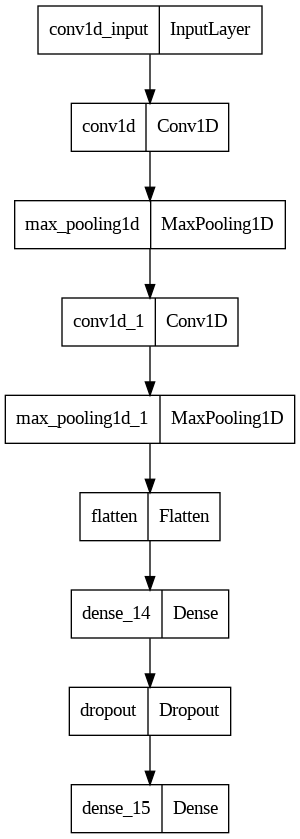

In [ ]:
keras.utils.plot_model(model)

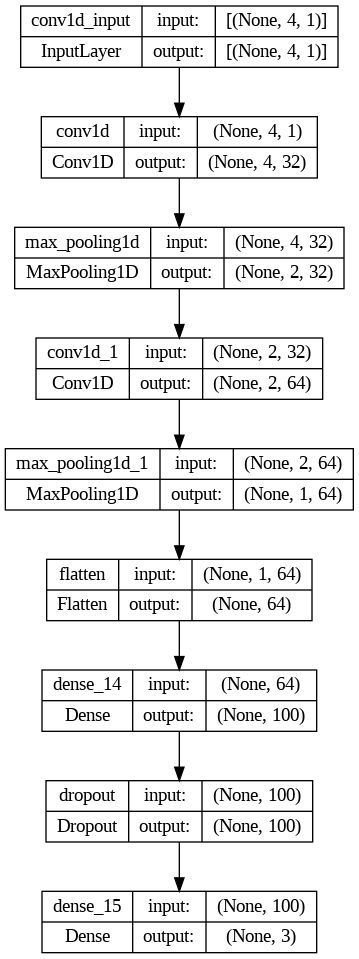

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv1d_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2, restore_best_weights=True)

In [ ]:
history = model.fit(X_train_sub, y_train_sub, epochs = 100,
                    validation_data = (X_train_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/100
3/3 [==============================] - 3s 244ms/step - loss: 1.0813 - accuracy: 0.3854 - val_loss: 1.0372 - val_accuracy: 0.2083
Epoch 2/100
3/3 [==============================] - 0s 49ms/step - loss: 1.0128 - accuracy: 0.4792 - val_loss: 1.0254 - val_accuracy: 0.5000


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


Epoch 3/100
3/3 [==============================] - 0s 59ms/step - loss: 0.9890 - accuracy: 0.5417 - val_loss: 0.9868 - val_accuracy: 0.5417
Epoch 4/100
3/3 [==============================] - 0s 53ms/step - loss: 0.9136 - accuracy: 0.6771 - val_loss: 0.9274 - val_accuracy: 0.5417
Epoch 5/100
3/3 [==============================] - 0s 64ms/step - loss: 0.8444 - accuracy: 0.6875 - val_loss: 0.8762 - val_accuracy: 0.5417
Epoch 6/100
3/3 [==============================] - 0s 45ms/step - loss: 0.8380 - accuracy: 0.6875 - val_loss: 0.8319 - val_accuracy: 0.5417
Epoch 7/100
3/3 [==============================] - 0s 51ms/step - loss: 0.7762 - accuracy: 0.7188 - val_loss: 0.7860 - val_accuracy: 0.5417
Epoch 8/100
3/3 [==============================] - 0s 72ms/step - loss: 0.7228 - accuracy: 0.7188 - val_loss: 0.7543 - val_accuracy: 0.5417
Epoch 9/100
3/3 [==============================] - 0s 103ms/step - loss: 0.7099 - accuracy: 0.6562 - val_loss: 0.7149 - val_accuracy: 0.5417
Epoch 10/100
3/3 [=

In [ ]:
print(early_stopping_cb.stopped_epoch)

22


In [ ]:
print(history)

In [ ]:
print(history.history)

{'loss': [1.0813261270523071, 1.0128499269485474, 0.9889666438102722, 0.9135608673095703, 0.8443730473518372, 0.837963879108429, 0.7762035727500916, 0.7228145599365234, 0.7098579406738281, 0.6357477903366089, 0.5807894468307495, 0.5360944271087646, 0.4984474182128906, 0.5246712565422058, 0.4460851848125458, 0.45043376088142395, 0.4091830253601074, 0.38643717765808105, 0.3895876407623291, 0.39072999358177185, 0.342012882232666, 0.3305777907371521, 0.3144124448299408], 'accuracy': [0.3854166567325592, 0.4791666567325592, 0.5416666865348816, 0.6770833134651184, 0.6875, 0.6875, 0.71875, 0.71875, 0.65625, 0.7291666865348816, 0.8125, 0.8020833134651184, 0.8125, 0.71875, 0.8125, 0.8125, 0.8645833134651184, 0.8854166865348816, 0.8541666865348816, 0.8020833134651184, 0.8854166865348816, 0.8541666865348816, 0.9166666865348816], 'val_loss': [1.037168025970459, 1.025400996208191, 0.9867939352989197, 0.9274177551269531, 0.8761759400367737, 0.831914484500885, 0.7859725952148438, 0.7542526125907898, 

In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


### 검증손실

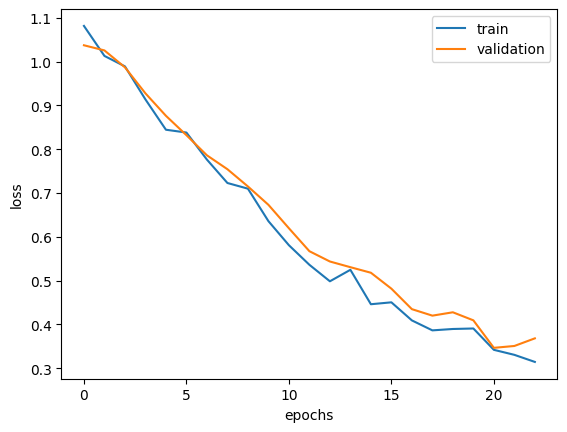

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
20,0.342013,0.885417,0.346566,0.916667


In [ ]:
model.evaluate(X_train_val, y_train_val)

1/1 [==============================] - 0s 82ms/step - loss: 0.3466 - accuracy: 0.9167


[0.346565842628479, 0.9166666865348816]

### 최종 모델

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (4, 1)))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(3, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
patience = 2
opt_epoch = early_stopping_cb.stopped_epoch - patience + 1

In [ ]:
model.fit(X_train, y_train, epochs = opt_epoch)

Epoch 1/21
4/4 [==============================] - 4s 7ms/step - loss: 1.1300 - accuracy: 0.3250
Epoch 2/21
4/4 [==============================] - 0s 7ms/step - loss: 1.0463 - accuracy: 0.3833
Epoch 3/21
4/4 [==============================] - 0s 4ms/step - loss: 1.0098 - accuracy: 0.4833
Epoch 4/21
4/4 [==============================] - 0s 4ms/step - loss: 0.9819 - accuracy: 0.5167
Epoch 5/21
4/4 [==============================] - 0s 4ms/step - loss: 0.9447 - accuracy: 0.6000
Epoch 6/21
4/4 [==============================] - 0s 4ms/step - loss: 0.8795 - accuracy: 0.6667
Epoch 7/21
4/4 [==============================] - 0s 4ms/step - loss: 0.8360 - accuracy: 0.6917
Epoch 8/21
4/4 [==============================] - 0s 4ms/step - loss: 0.7785 - accuracy: 0.7000
Epoch 9/21
4/4 [==============================] - 0s 4ms/step - loss: 0.7062 - accuracy: 0.7250
Epoch 10/21
4/4 [==============================] - 0s 5ms/step - loss: 0.6616 - accuracy: 0.7417
Epoch 11/21
4/4 [======================

In [ ]:
# 예측
y_test_pred = model.predict(X_test)

1/1 [==============================] - 0s 99ms/step


In [ ]:
y_test_bin = np.argmax(y_test_pred, axis = 1)

In [ ]:
np.mean(y_test == y_test_bin)

0.9

In [ ]:
model.evaluate(X_test, y_test)

1/1 [==============================] - 0s 207ms/step - loss: 0.3068 - accuracy: 0.9000


[0.30676767230033875, 0.8999999761581421]

## wine 데이터

In [ ]:
from sklearn import datasets

In [ ]:
data = datasets.load_wine()

In [ ]:
# 특성
data['feature_names']

['alcohol',
 'malic_acid',
 'ash',
 'alcalinity_of_ash',
 'magnesium',
 'total_phenols',
 'flavanoids',
 'nonflavanoid_phenols',
 'proanthocyanins',
 'color_intensity',
 'hue',
 'od280/od315_of_diluted_wines',
 'proline']

In [ ]:
# 타깃
data['target_names']

array(['class_0', 'class_1', 'class_2'], dtype='<U7')

In [ ]:
df = pd.DataFrame(data.data, columns = data.feature_names)

In [ ]:
df['class'] = data.target
df.head()

,alcohol,malic_acid,ash,alcalinity_of_ash,magnesium,total_phenols,flavanoids,nonflavanoid_phenols,proanthocyanins,color_intensity,hue,od280/od315_of_diluted_wines,proline,class
0,14.23,1.71,2.43,15.6,127.0,2.80,3.06,0.28,2.29,5.64,1.04,3.92,1065.0,0
1,13.20,1.78,2.14,11.2,100.0,2.65,2.76,0.26,1.28,4.38,1.05,3.40,1050.0,0
2,13.16,2.36,2.67,18.6,101.0,2.80,3.24,0.30,2.81,5.68,1.03,3.17,1185.0,0
3,14.37,1.95,2.50,16.8,113.0,3.85,3.49,0.24,2.18,7.80,0.86,3.45,1480.0,0
4,13.24,2.59,2.87,21.0,118.0,2.80,2.69,0.39,1.82,4.32,1.04,2.93,735.0,0


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 178 entries, 0 to 177
Data columns (total 14 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   alcohol                       178 non-null    float64
 1   malic_acid                    178 non-null    float64
 2   ash                           178 non-null    float64
 3   alcalinity_of_ash             178 non-null    float64
 4   magnesium                     178 non-null    float64
 5   total_phenols                 178 non-null    float64
 6   flavanoids                    178 non-null    float64
 7   nonflavanoid_phenols          178 non-null    float64
 8   proanthocyanins               178 non-null    float64
 9   color_intensity               178 non-null    float64
 10  hue                           178 non-null    float64
 11  od280/od315_of_diluted_wines  178 non-null    float64
 12  proline                       178 non-null    float64
 13  class

In [ ]:
df['class'].unique()

array([0, 1, 2])

In [ ]:
df['class'].value_counts()

class
1    71
0    59
2    48
Name: count, dtype: int64

In [ ]:
df.columns

Index(['alcohol', 'malic_acid', 'ash', 'alcalinity_of_ash', 'magnesium',
       'total_phenols', 'flavanoids', 'nonflavanoid_phenols',
       'proanthocyanins', 'color_intensity', 'hue',
       'od280/od315_of_diluted_wines', 'proline', 'class'],
      dtype='object')

In [ ]:
# X, y 분할
X = df.drop('class', axis = 1).values
y = df['class'].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (178, 13)
y 데이터:  (178,)


In [ ]:
X[:5]

array([[1.423e+01, 1.710e+00, 2.430e+00, 1.560e+01, 1.270e+02, 2.800e+00,
        3.060e+00, 2.800e-01, 2.290e+00, 5.640e+00, 1.040e+00, 3.920e+00,
        1.065e+03],
       [1.320e+01, 1.780e+00, 2.140e+00, 1.120e+01, 1.000e+02, 2.650e+00,
        2.760e+00, 2.600e-01, 1.280e+00, 4.380e+00, 1.050e+00, 3.400e+00,
        1.050e+03],
       [1.316e+01, 2.360e+00, 2.670e+00, 1.860e+01, 1.010e+02, 2.800e+00,
        3.240e+00, 3.000e-01, 2.810e+00, 5.680e+00, 1.030e+00, 3.170e+00,
        1.185e+03],
       [1.437e+01, 1.950e+00, 2.500e+00, 1.680e+01, 1.130e+02, 3.850e+00,
        3.490e+00, 2.400e-01, 2.180e+00, 7.800e+00, 8.600e-01, 3.450e+00,
        1.480e+03],
       [1.324e+01, 2.590e+00, 2.870e+00, 2.100e+01, 1.180e+02, 2.800e+00,
        2.690e+00, 3.900e-01, 1.820e+00, 4.320e+00, 1.040e+00, 2.930e+00,
        7.350e+02]])

In [ ]:
X = X.reshape(X.shape[0], X.shape[1], 1)
print(X.shape)

(178, 13, 1)


In [ ]:
# 훈련/테스트 데이터 분할
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state=42)
print("훈련데이터: ", X_train.shape)
print("테스트데이터: ", X_test.shape)

훈련데이터:  (142, 13, 1)
테스트데이터:  (36, 13, 1)


In [ ]:
# 훈련/검증 데이터 분할
from sklearn.model_selection import train_test_split
X_train_sub, X_train_val, y_train_sub, y_train_val = train_test_split(X_train,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)
print("훈련전체데이터: ", X_train.shape)
print("훈련서브데이터: ", X_train_sub.shape)
print("검증데이터: ", X_train_val.shape)

훈련전체데이터:  (142, 13, 1)
훈련서브데이터:  (113, 13, 1)
검증데이터:  (29, 13, 1)


### 모델 만들기

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(64, kernel_size = 2, activation = 'relu', padding = 'same',
                              input_shape = (13, 1)))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(128, kernel_size = 2, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(200, activation = 'relu'))
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(3, activation = 'softmax'))

In [ ]:
1 * 2 * 64 + 64

192

In [ ]:
64 * 2 * 128 + 128

16512

In [ ]:
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 13, 64)            192       
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 6, 64)             0         
 g1D)                                                            
                                                                 
 conv1d_5 (Conv1D)           (None, 6, 128)            16512     
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 3, 128)            0         
 g1D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 384)               0         
                                                                 
 dense_18 (Dense)            (None, 200)              

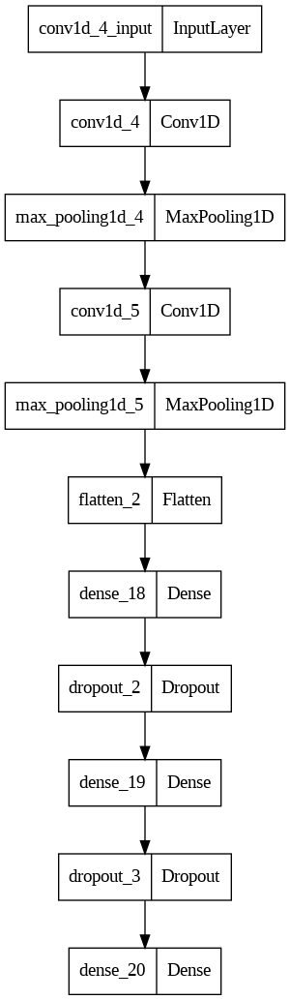

In [ ]:
keras.utils.plot_model(model)

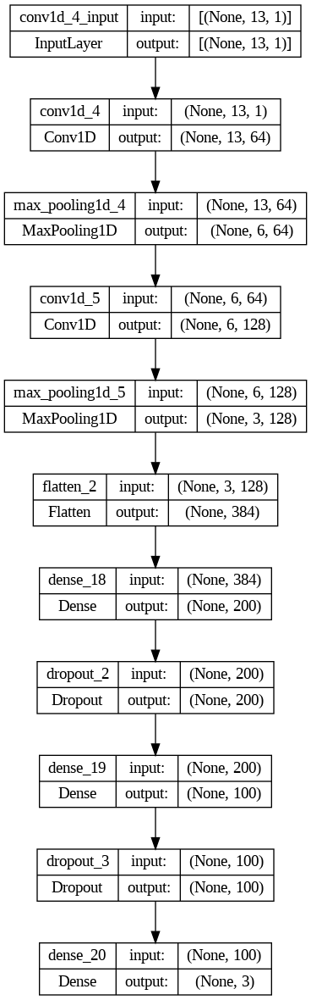

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv1d_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 3, restore_best_weights=True)

In [ ]:
history = model.fit(X_train_sub, y_train_sub, epochs = 100,
                    validation_data = (X_train_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/100
4/4 [==============================] - 2s 157ms/step - loss: 11.4974 - accuracy: 0.3274 - val_loss: 1.1677 - val_accuracy: 0.4138
Epoch 2/100
4/4 [==============================] - 0s 35ms/step - loss: 5.7701 - accuracy: 0.4071 - val_loss: 1.0793 - val_accuracy: 0.5862
Epoch 3/100


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


4/4 [==============================] - 0s 22ms/step - loss: 4.3910 - accuracy: 0.4248 - val_loss: 2.0107 - val_accuracy: 0.3793
Epoch 4/100
4/4 [==============================] - 0s 34ms/step - loss: 3.8865 - accuracy: 0.3451 - val_loss: 0.8422 - val_accuracy: 0.4483
Epoch 5/100
4/4 [==============================] - 0s 21ms/step - loss: 2.8481 - accuracy: 0.4248 - val_loss: 0.8601 - val_accuracy: 0.4483
Epoch 6/100
4/4 [==============================] - 0s 33ms/step - loss: 1.8785 - accuracy: 0.4867 - val_loss: 0.5679 - val_accuracy: 0.7241
Epoch 7/100
4/4 [==============================] - 0s 21ms/step - loss: 1.9847 - accuracy: 0.4779 - val_loss: 0.6521 - val_accuracy: 0.7586
Epoch 8/100
4/4 [==============================] - 0s 43ms/step - loss: 1.2565 - accuracy: 0.5310 - val_loss: 0.5274 - val_accuracy: 0.7586
Epoch 9/100
4/4 [==============================] - 0s 20ms/step - loss: 1.3586 - accuracy: 0.5487 - val_loss: 0.5482 - val_accuracy: 0.7586
Epoch 10/100
4/4 [==============

In [ ]:
print(early_stopping_cb.stopped_epoch)

10


In [ ]:
print(history)

In [ ]:
print(history.history)

{'loss': [11.497361183166504, 5.770079135894775, 4.3910088539123535, 3.8865420818328857, 2.8481316566467285, 1.8784887790679932, 1.9847403764724731, 1.2565290927886963, 1.3585751056671143, 1.3503769636154175, 1.316635012626648], 'accuracy': [0.32743361592292786, 0.40707963705062866, 0.4247787594795227, 0.3451327383518219, 0.4247787594795227, 0.48672565817832947, 0.47787609696388245, 0.5309734344482422, 0.5486725568771362, 0.5840708017349243, 0.5309734344482422], 'val_loss': [1.167721152305603, 1.0792654752731323, 2.0106637477874756, 0.8422050476074219, 0.8600775599479675, 0.5678647756576538, 0.6520546674728394, 0.5273584127426147, 0.5481661558151245, 0.6393650770187378, 0.7667673230171204], 'val_accuracy': [0.4137931168079376, 0.5862069129943848, 0.37931033968925476, 0.4482758641242981, 0.4482758641242981, 0.7241379022598267, 0.7586206793785095, 0.7586206793785095, 0.7586206793785095, 0.6206896305084229, 0.5862069129943848]}


In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


### 검증손실

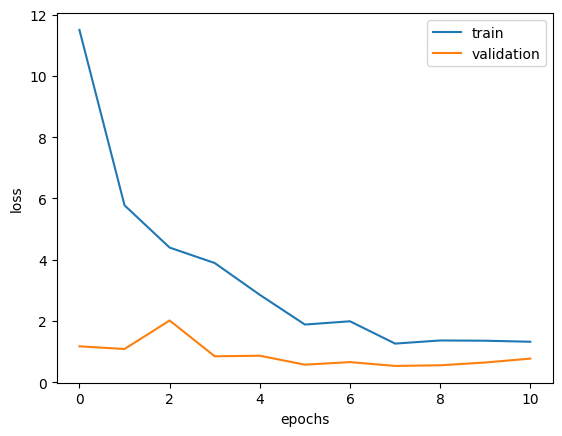

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
7,1.256529,0.530973,0.527358,0.758621


In [ ]:
model.evaluate(X_train_val, y_train_val)

1/1 [==============================] - 0s 56ms/step - loss: 0.5274 - accuracy: 0.7586


[0.5273584127426147, 0.7586206793785095]

### 최종 모델

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(64, kernel_size = 2, activation = 'relu', padding = 'same',
                              input_shape = (13, 1)))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(128, kernel_size = 2, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(200, activation = 'relu'))
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.2))
model.add(keras.layers.Dense(3, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
patience = 3
opt_epoch = early_stopping_cb.stopped_epoch - patience + 1

In [ ]:
model.fit(X_train, y_train, epochs = opt_epoch)

Epoch 1/8
5/5 [==============================] - 2s 12ms/step - loss: 12.9402 - accuracy: 0.4014
Epoch 2/8
5/5 [==============================] - 0s 8ms/step - loss: 11.2672 - accuracy: 0.3873
Epoch 3/8
5/5 [==============================] - 0s 11ms/step - loss: 13.5464 - accuracy: 0.4225
Epoch 4/8
5/5 [==============================] - 0s 9ms/step - loss: 7.1208 - accuracy: 0.4930
Epoch 5/8
5/5 [==============================] - 0s 10ms/step - loss: 5.5813 - accuracy: 0.4014
Epoch 6/8
5/5 [==============================] - 0s 9ms/step - loss: 2.7706 - accuracy: 0.5282
Epoch 7/8
5/5 [==============================] - 0s 6ms/step - loss: 2.4806 - accuracy: 0.4859
Epoch 8/8
5/5 [==============================] - 0s 6ms/step - loss: 2.0490 - accuracy: 0.5141


In [ ]:
# 예측
y_test_pred = model.predict(X_test)

2/2 [==============================] - 0s 6ms/step


In [ ]:
y_test_bin = np.argmax(y_test_pred, axis = 1)

In [ ]:
np.mean(y_test == y_test_bin)

0.5833333333333334

In [ ]:
model.evaluate(X_test, y_test)

2/2 [==============================] - 0s 8ms/step - loss: 0.9582 - accuracy: 0.5833


[0.9581891298294067, 0.5833333134651184]

# 1차원 합성곱 신경망 - 최종 점검 문제

## 와인데이터 - 이진분류

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/wine.csv', header = None)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6497 entries, 0 to 6496
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       6497 non-null   float64
 1   1       6497 non-null   float64
 2   2       6497 non-null   float64
 3   3       6497 non-null   float64
 4   4       6497 non-null   float64
 5   5       6497 non-null   float64
 6   6       6497 non-null   float64
 7   7       6497 non-null   float64
 8   8       6497 non-null   float64
 9   9       6497 non-null   float64
 10  10      6497 non-null   float64
 11  11      6497 non-null   int64  
 12  12      6497 non-null   int64  
dtypes: float64(11), int64(2)
memory usage: 660.0 KB


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,6497.0,7.215307,1.296434,3.80000,6.40000,7.00000,7.70000,15.90000
1,6497.0,0.339666,0.164636,0.08000,0.23000,0.29000,0.40000,1.58000
2,6497.0,0.318633,0.145318,0.00000,0.25000,0.31000,0.39000,1.66000
3,6497.0,5.443235,4.757804,0.60000,1.80000,3.00000,8.10000,65.80000
4,6497.0,0.056034,0.035034,0.00900,0.03800,0.04700,0.06500,0.61100
5,6497.0,30.525319,17.749400,1.00000,17.00000,29.00000,41.00000,289.00000
6,6497.0,115.744574,56.521855,6.00000,77.00000,118.00000,156.00000,440.00000
7,6497.0,0.994697,0.002999,0.98711,0.99234,0.99489,0.99699,1.03898
8,6497.0,3.218501,0.160787,2.72000,3.11000,3.21000,3.32000,4.01000
9,6497.0,0.531268,0.148806,0.22000,0.43000,0.51000,0.60000,2.00000


In [ ]:
df[12].unique()

array([1, 0])

In [ ]:
df[12].value_counts()

12
0    4898
1    1599
Name: count, dtype: int64

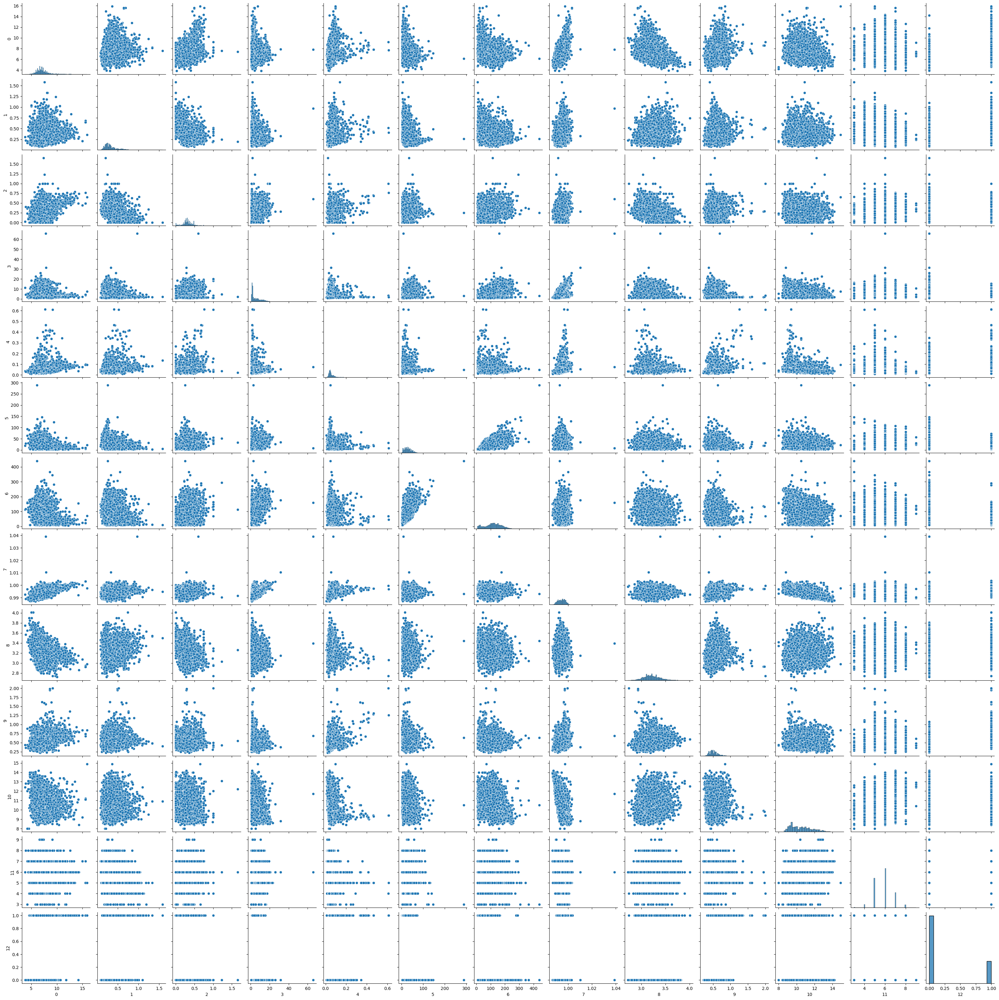

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12], dtype='int64')

In [ ]:
# 데이터 분할
# 전체 데이터
X = df.drop([12], axis = 1).values
y = df[12].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (6497, 12)
y 데이터:  (6497,)


In [ ]:
X[:5]

array([[7.400e+00, 7.000e-01, 0.000e+00, 1.900e+00, 7.600e-02, 1.100e+01,
        3.400e+01, 9.978e-01, 3.510e+00, 5.600e-01, 9.400e+00, 5.000e+00],
       [7.800e+00, 8.800e-01, 0.000e+00, 2.600e+00, 9.800e-02, 2.500e+01,
        6.700e+01, 9.968e-01, 3.200e+00, 6.800e-01, 9.800e+00, 5.000e+00],
       [7.800e+00, 7.600e-01, 4.000e-02, 2.300e+00, 9.200e-02, 1.500e+01,
        5.400e+01, 9.970e-01, 3.260e+00, 6.500e-01, 9.800e+00, 5.000e+00],
       [1.120e+01, 2.800e-01, 5.600e-01, 1.900e+00, 7.500e-02, 1.700e+01,
        6.000e+01, 9.980e-01, 3.160e+00, 5.800e-01, 9.800e+00, 6.000e+00],
       [7.400e+00, 7.000e-01, 0.000e+00, 1.900e+00, 7.600e-02, 1.100e+01,
        3.400e+01, 9.978e-01, 3.510e+00, 5.600e-01, 9.400e+00, 5.000e+00]])

In [ ]:
X = X.reshape(X.shape[0], X.shape[1], 1)
print(X.shape)

(6497, 12, 1)


In [ ]:
X[:5]

array([[[7.400e+00],
        [7.000e-01],
        [0.000e+00],
        [1.900e+00],
        [7.600e-02],
        [1.100e+01],
        [3.400e+01],
        [9.978e-01],
        [3.510e+00],
        [5.600e-01],
        [9.400e+00],
        [5.000e+00]],

       [[7.800e+00],
        [8.800e-01],
        [0.000e+00],
        [2.600e+00],
        [9.800e-02],
        [2.500e+01],
        [6.700e+01],
        [9.968e-01],
        [3.200e+00],
        [6.800e-01],
        [9.800e+00],
        [5.000e+00]],

       [[7.800e+00],
        [7.600e-01],
        [4.000e-02],
        [2.300e+00],
        [9.200e-02],
        [1.500e+01],
        [5.400e+01],
        [9.970e-01],
        [3.260e+00],
        [6.500e-01],
        [9.800e+00],
        [5.000e+00]],

       [[1.120e+01],
        [2.800e-01],
        [5.600e-01],
        [1.900e+00],
        [7.500e-02],
        [1.700e+01],
        [6.000e+01],
        [9.980e-01],
        [3.160e+00],
        [5.800e-01],
        [9.800e+00],
       

In [ ]:
# 데이터 분할 = 훈련 데이터 / 테스트 데이터
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.2,
                                                    random_state = 42)
print("train 데이터: ", X_train.shape)
print("test 데이터: ", X_test.shape)

train 데이터:  (5197, 12, 1)
test 데이터:  (1300, 12, 1)


### 모델 만들기

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (X_train.shape[1], X_train.shape[2])))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(1, activation = 'sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d (Conv1D)             (None, 12, 32)            128       
                                                                 
 max_pooling1d (MaxPooling1  (None, 6, 32)             0         
 D)                                                              
                                                                 
 conv1d_1 (Conv1D)           (None, 6, 64)             6208      
                                                                 
 max_pooling1d_1 (MaxPoolin  (None, 3, 64)             0         
 g1D)                                                            
                                                                 
 flatten (Flatten)           (None, 192)               0         
                                                                 
 dense (Dense)               (None, 100)               1

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'binary_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_cnn_model.h5',
                                                save_best_only=True)
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2,
                                                  restore_best_weights = True)

In [ ]:
history = model.fit(X_train, y_train, epochs = 100,
                    validation_split = 0.2,
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/100
130/130 [==============================] - 2s 7ms/step - loss: 0.4762 - accuracy: 0.8739 - val_loss: 0.2138 - val_accuracy: 0.9250
Epoch 2/100
 47/130 [=========>....................] - ETA: 0s - loss: 0.2028 - accuracy: 0.9328

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


130/130 [==============================] - 1s 4ms/step - loss: 0.2027 - accuracy: 0.9317 - val_loss: 0.1777 - val_accuracy: 0.9385
Epoch 3/100
130/130 [==============================] - 1s 9ms/step - loss: 0.1900 - accuracy: 0.9363 - val_loss: 0.1668 - val_accuracy: 0.9471
Epoch 4/100
130/130 [==============================] - 2s 15ms/step - loss: 0.1706 - accuracy: 0.9430 - val_loss: 0.1689 - val_accuracy: 0.9462
Epoch 5/100
130/130 [==============================] - 2s 15ms/step - loss: 0.1415 - accuracy: 0.9512 - val_loss: 0.1222 - val_accuracy: 0.9519
Epoch 6/100
130/130 [==============================] - 2s 12ms/step - loss: 0.1119 - accuracy: 0.9603 - val_loss: 0.0837 - val_accuracy: 0.9769
Epoch 7/100
130/130 [==============================] - 1s 9ms/step - loss: 0.0884 - accuracy: 0.9704 - val_loss: 0.0934 - val_accuracy: 0.9740
Epoch 8/100
130/130 [==============================] - 1s 9ms/step - loss: 0.0876 - accuracy: 0.9743 - val_loss: 0.0695 - val_accuracy: 0.9798
Epoch 9/

In [ ]:
print(early_stopping_cb.stopped_epoch)

15


### 검증손실

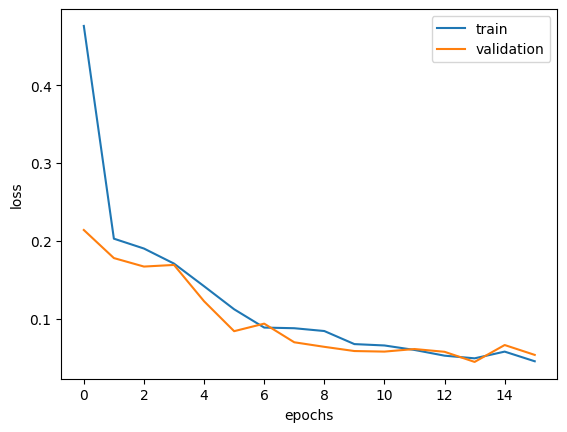

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

### 최종 모델

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (X_train.shape[1], X_train.shape[2])))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(1, activation = 'sigmoid'))

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'binary_crossentropy', metrics = 'accuracy')

In [ ]:
patience = 2
opt_epoch = early_stopping_cb.stopped_epoch - patience + 1

In [ ]:
model.fit(X_train, y_train, epochs = opt_epoch)

Epoch 1/14
163/163 [==============================] - 3s 6ms/step - loss: 0.4405 - accuracy: 0.8820
Epoch 2/14
163/163 [==============================] - 1s 6ms/step - loss: 0.1970 - accuracy: 0.9334
Epoch 3/14
163/163 [==============================] - 1s 6ms/step - loss: 0.1798 - accuracy: 0.9402
Epoch 4/14
163/163 [==============================] - 1s 6ms/step - loss: 0.1621 - accuracy: 0.9457
Epoch 5/14
163/163 [==============================] - 1s 3ms/step - loss: 0.1256 - accuracy: 0.9556
Epoch 6/14
163/163 [==============================] - 1s 3ms/step - loss: 0.0982 - accuracy: 0.9677
Epoch 7/14
163/163 [==============================] - 1s 6ms/step - loss: 0.0787 - accuracy: 0.9756
Epoch 8/14
163/163 [==============================] - 1s 6ms/step - loss: 0.0738 - accuracy: 0.9750
Epoch 9/14
163/163 [==============================] - 1s 7ms/step - loss: 0.0714 - accuracy: 0.9767
Epoch 10/14
163/163 [==============================] - 1s 8ms/step - loss: 0.0722 - accuracy: 0.9775

In [ ]:
model.evaluate(X_test, y_test)

41/41 [==============================] - 0s 4ms/step - loss: 0.0865 - accuracy: 0.9754


[0.08649318665266037, 0.9753845930099487]

In [ ]:
model.predict(X_test)

41/41 [==============================] - 0s 2ms/step


array([[2.2087955e-04],
       [9.4211572e-01],
       [3.0007318e-03],
       ...,
       [9.1600008e-03],
       [1.7457096e-04],
       [3.3506122e-04]], dtype=float32)

In [ ]:
y_test_pred = model.predict(X_test).flatten()

41/41 [==============================] - 0s 2ms/step


In [ ]:
y_test_pred

array([2.2087955e-04, 9.4211572e-01, 3.0007318e-03, ..., 9.1600008e-03,
       1.7457096e-04, 3.3506122e-04], dtype=float32)

In [ ]:
y_test_bin = [round(x) for x in y_test_pred]

In [ ]:
np.mean(y_test == y_test_bin)

0.9753846153846154

## 집값 예측 문제

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/house_price.csv', header = None,
            delim_whitespace = True)
df.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13
0,0.00632,18.0,2.31,0,0.538,6.575,65.2,4.0900,1,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0,0.469,6.421,78.9,4.9671,2,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0,0.469,7.185,61.1,4.9671,2,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0,0.458,6.998,45.8,6.0622,3,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0,0.458,7.147,54.2,6.0622,3,222.0,18.7,396.90,5.33,36.2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   0       506 non-null    float64
 1   1       506 non-null    float64
 2   2       506 non-null    float64
 3   3       506 non-null    int64  
 4   4       506 non-null    float64
 5   5       506 non-null    float64
 6   6       506 non-null    float64
 7   7       506 non-null    float64
 8   8       506 non-null    int64  
 9   9       506 non-null    float64
 10  10      506 non-null    float64
 11  11      506 non-null    float64
 12  12      506 non-null    float64
 13  13      506 non-null    float64
dtypes: float64(12), int64(2)
memory usage: 55.5 KB


In [ ]:
df.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
0,506.0,3.613524,8.601545,0.00632,0.082045,0.25651,3.677083,88.9762
1,506.0,11.363636,23.322453,0.00000,0.000000,0.00000,12.500000,100.0000
2,506.0,11.136779,6.860353,0.46000,5.190000,9.69000,18.100000,27.7400
3,506.0,0.069170,0.253994,0.00000,0.000000,0.00000,0.000000,1.0000
4,506.0,0.554695,0.115878,0.38500,0.449000,0.53800,0.624000,0.8710
5,506.0,6.284634,0.702617,3.56100,5.885500,6.20850,6.623500,8.7800
6,506.0,68.574901,28.148861,2.90000,45.025000,77.50000,94.075000,100.0000
7,506.0,3.795043,2.105710,1.12960,2.100175,3.20745,5.188425,12.1265
8,506.0,9.549407,8.707259,1.00000,4.000000,5.00000,24.000000,24.0000
9,506.0,408.237154,168.537116,187.00000,279.000000,330.00000,666.000000,711.0000


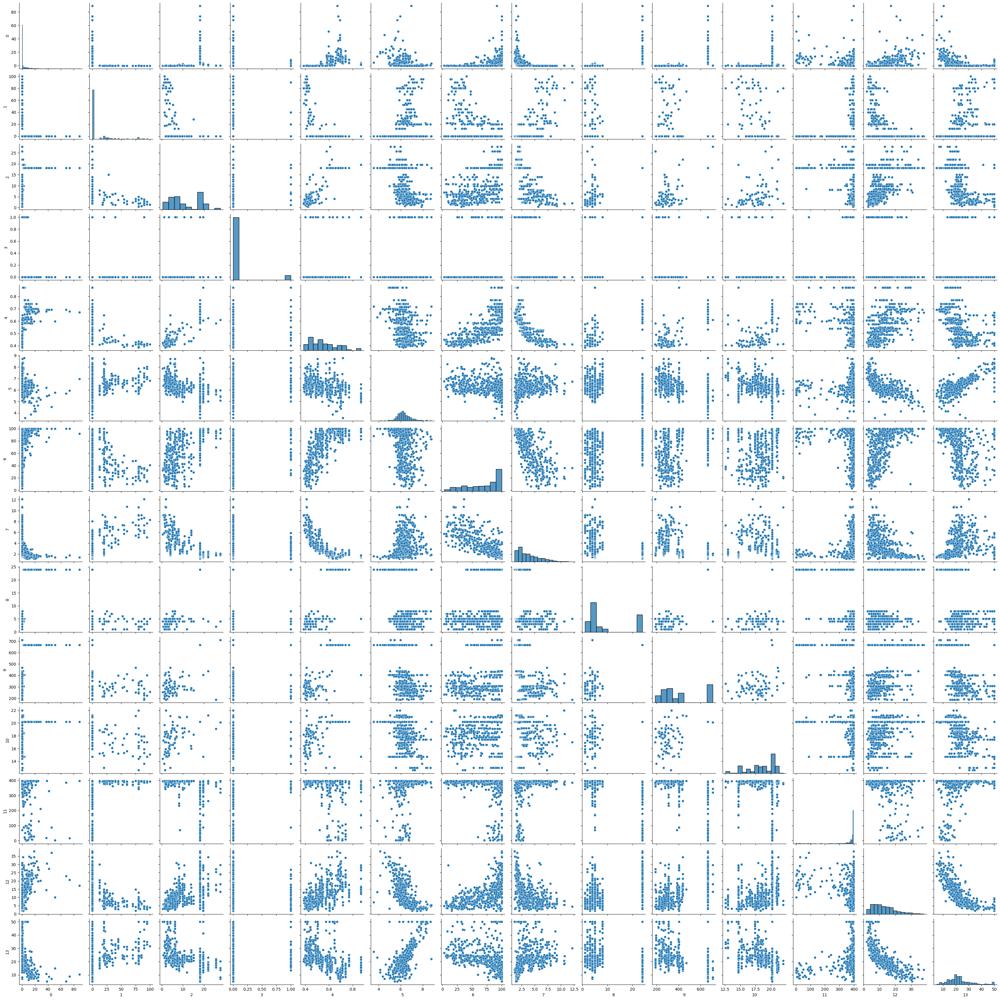

In [ ]:
sns.pairplot(df)
plt.show()

In [ ]:
df.columns

Index([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13], dtype='int64')

In [ ]:
# 데이터 분할
# 전체 데이터
X = df.drop([13], axis = 1).values
y = df[13].values

print("X 데이터: ", X.shape)
print("y 데이터: ", y.shape)

X 데이터:  (506, 13)
y 데이터:  (506,)


In [ ]:
X[:5]

array([[6.3200e-03, 1.8000e+01, 2.3100e+00, 0.0000e+00, 5.3800e-01,
        6.5750e+00, 6.5200e+01, 4.0900e+00, 1.0000e+00, 2.9600e+02,
        1.5300e+01, 3.9690e+02, 4.9800e+00],
       [2.7310e-02, 0.0000e+00, 7.0700e+00, 0.0000e+00, 4.6900e-01,
        6.4210e+00, 7.8900e+01, 4.9671e+00, 2.0000e+00, 2.4200e+02,
        1.7800e+01, 3.9690e+02, 9.1400e+00],
       [2.7290e-02, 0.0000e+00, 7.0700e+00, 0.0000e+00, 4.6900e-01,
        7.1850e+00, 6.1100e+01, 4.9671e+00, 2.0000e+00, 2.4200e+02,
        1.7800e+01, 3.9283e+02, 4.0300e+00],
       [3.2370e-02, 0.0000e+00, 2.1800e+00, 0.0000e+00, 4.5800e-01,
        6.9980e+00, 4.5800e+01, 6.0622e+00, 3.0000e+00, 2.2200e+02,
        1.8700e+01, 3.9463e+02, 2.9400e+00],
       [6.9050e-02, 0.0000e+00, 2.1800e+00, 0.0000e+00, 4.5800e-01,
        7.1470e+00, 5.4200e+01, 6.0622e+00, 3.0000e+00, 2.2200e+02,
        1.8700e+01, 3.9690e+02, 5.3300e+00]])

In [ ]:
X = X.reshape(X.shape[0], X.shape[1], 1)
print(X.shape)

(506, 13, 1)


In [ ]:
X[:5]

array([[[6.3200e-03],
        [1.8000e+01],
        [2.3100e+00],
        [0.0000e+00],
        [5.3800e-01],
        [6.5750e+00],
        [6.5200e+01],
        [4.0900e+00],
        [1.0000e+00],
        [2.9600e+02],
        [1.5300e+01],
        [3.9690e+02],
        [4.9800e+00]],

       [[2.7310e-02],
        [0.0000e+00],
        [7.0700e+00],
        [0.0000e+00],
        [4.6900e-01],
        [6.4210e+00],
        [7.8900e+01],
        [4.9671e+00],
        [2.0000e+00],
        [2.4200e+02],
        [1.7800e+01],
        [3.9690e+02],
        [9.1400e+00]],

       [[2.7290e-02],
        [0.0000e+00],
        [7.0700e+00],
        [0.0000e+00],
        [4.6900e-01],
        [7.1850e+00],
        [6.1100e+01],
        [4.9671e+00],
        [2.0000e+00],
        [2.4200e+02],
        [1.7800e+01],
        [3.9283e+02],
        [4.0300e+00]],

       [[3.2370e-02],
        [0.0000e+00],
        [2.1800e+00],
        [0.0000e+00],
        [4.5800e-01],
        [6.9980e+00],
    

In [ ]:
# 데이터 분할 = 훈련 데이터 / 테스트 데이터
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y,
                                                    test_size = 0.3,
                                                    random_state = 42)
print("train 데이터: ", X_train.shape)
print("test 데이터: ", X_test.shape)

train 데이터:  (354, 13, 1)
test 데이터:  (152, 13, 1)


### 모델 만들기

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (X_train.shape[1], X_train.shape[2])))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(128, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(120, activation = 'relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(60, activation = 'relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(1))

In [ ]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_4 (Conv1D)           (None, 13, 64)            256       
                                                                 
 max_pooling1d_4 (MaxPoolin  (None, 6, 64)             0         
 g1D)                                                            
                                                                 
 conv1d_5 (Conv1D)           (None, 6, 128)            24704     
                                                                 
 max_pooling1d_5 (MaxPoolin  (None, 3, 128)            0         
 g1D)                                                            
                                                                 
 flatten_2 (Flatten)         (None, 384)               0         
                                                                 
 dense_4 (Dense)             (None, 120)              

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'mse', metrics = 'mae')
history = model.fit(X_train, y_train, epochs = 200,
                    validation_split = 0.2)

Epoch 1/200
9/9 [==============================] - 2s 36ms/step - loss: 415.8318 - mae: 15.7158 - val_loss: 92.3915 - val_mae: 6.4910
Epoch 2/200
9/9 [==============================] - 0s 10ms/step - loss: 142.8755 - mae: 9.5859 - val_loss: 116.8378 - val_mae: 7.9057
Epoch 3/200
9/9 [==============================] - 0s 11ms/step - loss: 129.7537 - mae: 8.7800 - val_loss: 79.1687 - val_mae: 6.2878
Epoch 4/200
9/9 [==============================] - 0s 12ms/step - loss: 112.6650 - mae: 7.8703 - val_loss: 74.2126 - val_mae: 5.7033
Epoch 5/200
9/9 [==============================] - 0s 10ms/step - loss: 108.9822 - mae: 7.8968 - val_loss: 69.3493 - val_mae: 5.3935
Epoch 6/200
9/9 [==============================] - 0s 9ms/step - loss: 107.2289 - mae: 7.8502 - val_loss: 97.5280 - val_mae: 6.9788
Epoch 7/200
9/9 [==============================] - 0s 10ms/step - loss: 119.1338 - mae: 8.2297 - val_loss: 98.2679 - val_mae: 6.9678
Epoch 8/200
9/9 [==============================] - 0s 10ms/step - lo

### 검증손실

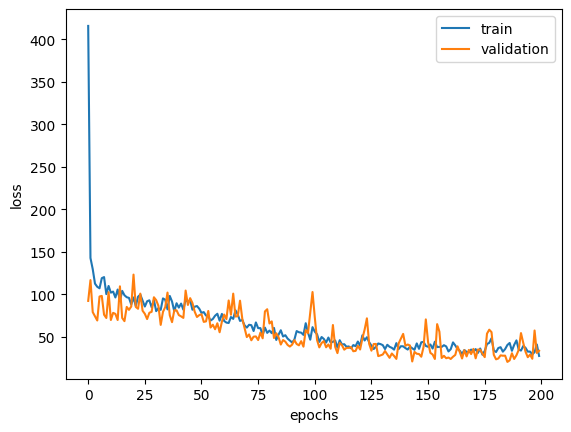

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,mae,val_loss,val_mae
185,40.52454,4.601003,20.605095,3.335654


### 최종 모델

In [ ]:
# 1차원 합성곱 신경망 모델
model = keras.Sequential()
model.add(keras.layers.Conv1D(64, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (X_train.shape[1], X_train.shape[2])))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Conv1D(128, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPooling1D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(120, activation = 'relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(60, activation = 'relu'))
model.add(keras.layers.Dropout(0.3))
model.add(keras.layers.Dense(1))

In [ ]:
adam = keras.optimizers.Adam(learning_rate = 0.001)
model.compile(optimizer = adam, loss = 'mse', metrics = 'mae')

In [ ]:
opt_epoch = history_df[history_df['val_loss'] == min(history_df['val_loss'])].index[0]
opt_epoch = opt_epoch + 1

In [ ]:
model.fit(X_train, y_train, epochs = opt_epoch)

Epoch 1/186
12/12 [==============================] - 1s 5ms/step - loss: 603.7796 - mae: 18.5300
Epoch 2/186
12/12 [==============================] - 0s 5ms/step - loss: 234.4930 - mae: 12.0213
Epoch 3/186
12/12 [==============================] - 0s 5ms/step - loss: 169.9012 - mae: 10.1717
Epoch 4/186
12/12 [==============================] - 0s 5ms/step - loss: 146.5064 - mae: 9.3009
Epoch 5/186
12/12 [==============================] - 0s 5ms/step - loss: 135.5236 - mae: 8.7104
Epoch 6/186
12/12 [==============================] - 0s 4ms/step - loss: 125.3314 - mae: 8.4349
Epoch 7/186
12/12 [==============================] - 0s 4ms/step - loss: 137.8680 - mae: 8.8734
Epoch 8/186
12/12 [==============================] - 0s 5ms/step - loss: 113.3337 - mae: 8.0950
Epoch 9/186
12/12 [==============================] - 0s 5ms/step - loss: 108.2522 - mae: 8.0572
Epoch 10/186
12/12 [==============================] - 0s 4ms/step - loss: 107.7262 - mae: 7.7022
Epoch 11/186
12/12 [================

In [ ]:
model.evaluate(X_test, y_test)

5/5 [==============================] - 0s 4ms/step - loss: 59.6806 - mae: 6.2569


[59.680580139160156, 6.256855487823486]

In [ ]:
# 예측
y_test_pred = model.predict(X_test).flatten()

5/5 [==============================] - 0s 3ms/step


In [ ]:
y_test

array([23.6, 32.4, 13.6, 22.8, 16.1, 20. , 17.8, 14. , 19.6, 16.8, 21.5,
       18.9,  7. , 21.2, 18.5, 29.8, 18.8, 10.2, 50. , 14.1, 25.2, 29.1,
       12.7, 22.4, 14.2, 13.8, 20.3, 14.9, 21.7, 18.3, 23.1, 23.8, 15. ,
       20.8, 19.1, 19.4, 34.7, 19.5, 24.4, 23.4, 19.7, 28.2, 50. , 17.4,
       22.6, 15.1, 13.1, 24.2, 19.9, 24. , 18.9, 35.4, 15.2, 26.5, 43.5,
       21.2, 18.4, 28.5, 23.9, 18.5, 25. , 35.4, 31.5, 20.2, 24.1, 20. ,
       13.1, 24.8, 30.8, 12.7, 20. , 23.7, 10.8, 20.6, 20.8,  5. , 20.1,
       48.5, 10.9,  7. , 20.9, 17.2, 20.9,  9.7, 19.4, 29. , 16.4, 25. ,
       25. , 17.1, 23.2, 10.4, 19.6, 17.2, 27.5, 23. , 50. , 17.9,  9.6,
       17.2, 22.5, 21.4, 12. , 19.9, 19.4, 13.4, 18.2, 24.6, 21.1, 24.7,
        8.7, 27.5, 20.7, 36.2, 31.6, 11.7, 39.8, 13.9, 21.8, 23.7, 17.6,
       24.4,  8.8, 19.2, 25.3, 20.4, 23.1, 37.9, 15.6, 45.4, 15.7, 22.6,
       14.5, 18.7, 17.8, 16.1, 20.6, 31.6, 29.1, 15.6, 17.5, 22.5, 19.4,
       19.3,  8.5, 20.6, 17. , 17.1, 14.5, 50. , 14

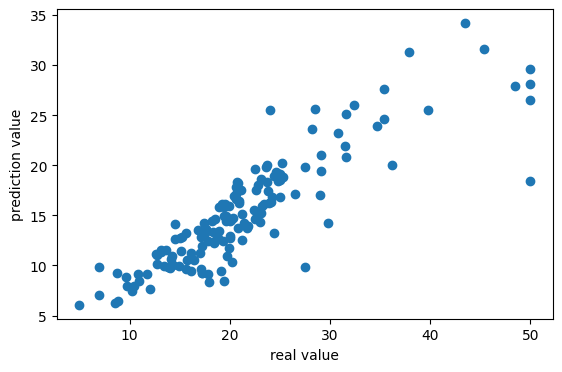

In [ ]:
plt.axes(aspect = 'equal')
plt.scatter(y_test, y_test_pred)
plt.xlabel('real value')
plt.ylabel('prediction value')
plt.show()

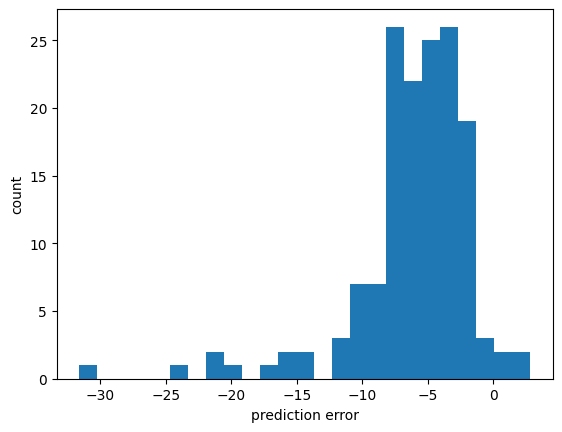

In [ ]:
error = y_test_pred - y_test
plt.hist(error, bins = 25)
plt.xlabel('prediction error')
plt.ylabel('count')
plt.show()

In [ ]:
# 절차상 표준화, 정규화 작업을 생략했음


# 2차원 합성곱 신경망 모델

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

4422102/4422102 [==============================] - 0s 0us/step


In [ ]:
(x_train, y_train), (x_test, y_test)

((array([[[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]],
  
         [[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]],
  
         [[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]],
  
         ...,
  
         [[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          ...,
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0]],
  
         [[0, 0, 0, ..., 0, 0, 0],
          [0, 0, 0, ..., 0, 0, 0

In [ ]:
print(x_train.shape, y_train.shape)
# 이미지 6 만장, 가로 * 세로

(60000, 28, 28) (60000,)


In [ ]:
print(x_test.shape, y_test.shape)
# 이미지 1 만장, 가로 * 세로

(10000, 28, 28) (10000,)


In [ ]:
x_train_scale = x_train.reshape(-1, 28, 28, 1) / 255

In [ ]:
# 검증 데이터 분할
from sklearn.model_selection import train_test_split
x_train_scale_sub, x_train_scale_val, y_train_sub, y_train_val = train_test_split(x_train_scale,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)

In [ ]:
print(x_train_scale.shape)
print(x_train_scale_sub.shape)
print(x_train_scale_val.shape)

(60000, 28, 28, 1)
(48000, 28, 28, 1)
(12000, 28, 28, 1)


## 모델 만들기

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32, kernel_size = (3, 3), activation = 'relu', padding = 'same',
                              input_shape = (28,28,1)))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Conv2D(64, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
3 * 3 * 32 + 32

320

In [ ]:
32 * 3 * 3 * 64 + 64

18496

In [ ]:
model.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 28, 28, 32)        320       
                                                                 
 max_pooling2d (MaxPooling2  (None, 14, 14, 32)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 14, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 7, 7, 64)          0         
 g2D)                                                            
                                                                 
 flatten_4 (Flatten)         (None, 3136)              0         
                                                                 
 dense_10 (Dense)            (None, 100)              

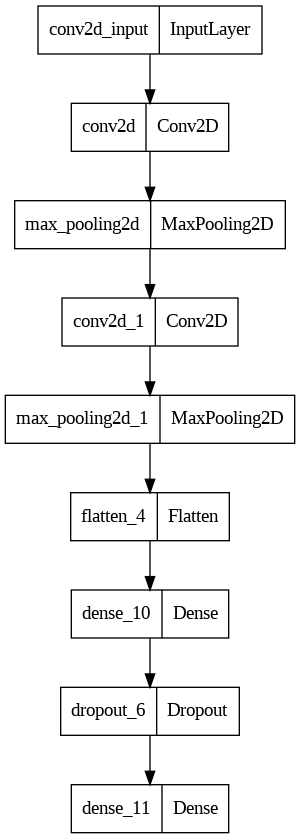

In [ ]:
keras.utils.plot_model(model)

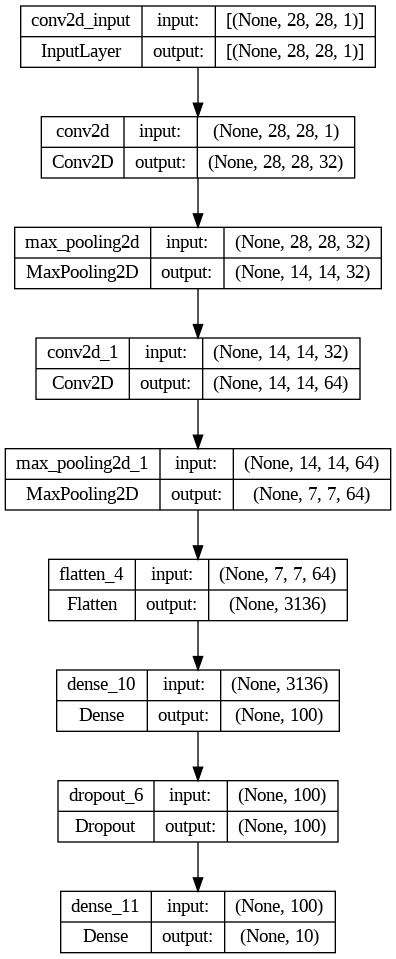

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv2d_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2, restore_best_weights=True)

In [ ]:
history = model.fit(x_train_scale_sub, y_train_sub, epochs = 20,
                    validation_data = (x_train_scale_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/20
1500/1500 [==============================] - 73s 48ms/step - loss: 0.5217 - accuracy: 0.8109 - val_loss: 0.3276 - val_accuracy: 0.8777
Epoch 2/20
   3/1500 [..............................] - ETA: 49s - loss: 0.4468 - accuracy: 0.8333

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1500/1500 [==============================] - 63s 42ms/step - loss: 0.3458 - accuracy: 0.8757 - val_loss: 0.2731 - val_accuracy: 0.8982
Epoch 3/20
1500/1500 [==============================] - 65s 43ms/step - loss: 0.2986 - accuracy: 0.8909 - val_loss: 0.2559 - val_accuracy: 0.9056
Epoch 4/20
1500/1500 [==============================] - 62s 41ms/step - loss: 0.2656 - accuracy: 0.9032 - val_loss: 0.2457 - val_accuracy: 0.9079
Epoch 5/20
1500/1500 [==============================] - 62s 41ms/step - loss: 0.2361 - accuracy: 0.9124 - val_loss: 0.2356 - val_accuracy: 0.9124
Epoch 6/20
1500/1500 [==============================] - 64s 43ms/step - loss: 0.2186 - accuracy: 0.9189 - val_loss: 0.2304 - val_accuracy: 0.9147
Epoch 7/20
1500/1500 [==============================] - 60s 40ms/step - loss: 0.2019 - accuracy: 0.9261 - val_loss: 0.2206 - val_accuracy: 0.9203
Epoch 8/20
1500/1500 [==============================] - 62s 41ms/step - loss: 0.1853 - accuracy: 0.9307 - val_loss: 0.2284 - val_accura

In [ ]:
print(early_stopping_cb.stopped_epoch)

10


In [ ]:
print(history)

In [ ]:
print(history.history)

{'loss': [0.5217159986495972, 0.3458287715911865, 0.2986176311969757, 0.26562413573265076, 0.23607730865478516, 0.21859297156333923, 0.20187947154045105, 0.18525181710720062, 0.17347487807273865, 0.16092145442962646, 0.15089862048625946], 'accuracy': [0.8109166622161865, 0.8757291436195374, 0.8908958435058594, 0.9031875133514404, 0.9123749732971191, 0.9189375042915344, 0.9261249899864197, 0.9306666851043701, 0.9356041550636292, 0.9390000104904175, 0.9426666498184204], 'val_loss': [0.3275594413280487, 0.2730613648891449, 0.2558533251285553, 0.24568572640419006, 0.23557153344154358, 0.23035702109336853, 0.22063174843788147, 0.22844485938549042, 0.21592985093593597, 0.23531554639339447, 0.2301912009716034], 'val_accuracy': [0.8777499794960022, 0.8982499837875366, 0.9055833220481873, 0.9079166650772095, 0.9124166369438171, 0.9147499799728394, 0.9203333258628845, 0.92208331823349, 0.9232500195503235, 0.9227499961853027, 0.921833336353302]}


In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


## 검증손실

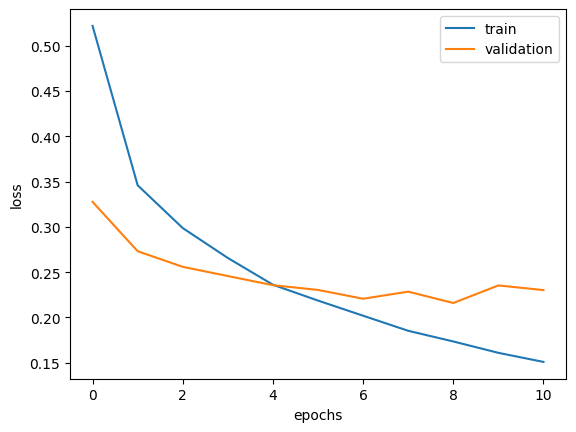

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
8,0.173475,0.935604,0.21593,0.92325


In [ ]:
model.evaluate(x_train_scale_val, y_train_val)

375/375 [==============================] - 6s 14ms/step - loss: 0.2159 - accuracy: 0.9233


[0.21592985093593597, 0.9232500195503235]

## 최종 모델

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32, kernel_size = (3, 3), activation = 'relu', padding = 'same',
                              input_shape = (28,28,1)))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Conv2D(64, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
opt_epoch = history_df[history_df['val_loss'] == min(history_df['val_loss'])].index[0]
opt_epoch = opt_epoch + 1

In [ ]:
model.fit(x_train_scale, y_train, epochs = opt_epoch)

Epoch 1/9
1875/1875 [==============================] - 73s 39ms/step - loss: 0.4876 - accuracy: 0.8253
Epoch 2/9
1875/1875 [==============================] - 84s 45ms/step - loss: 0.3213 - accuracy: 0.8867
Epoch 3/9
1875/1875 [==============================] - 90s 48ms/step - loss: 0.2747 - accuracy: 0.9009
Epoch 4/9
1875/1875 [==============================] - 84s 45ms/step - loss: 0.2449 - accuracy: 0.9117
Epoch 5/9
1875/1875 [==============================] - 75s 40ms/step - loss: 0.2219 - accuracy: 0.9187
Epoch 6/9
1875/1875 [==============================] - 83s 44ms/step - loss: 0.2037 - accuracy: 0.9253
Epoch 7/9
1875/1875 [==============================] - 80s 43ms/step - loss: 0.1892 - accuracy: 0.9293
Epoch 8/9
1875/1875 [==============================] - 84s 45ms/step - loss: 0.1732 - accuracy: 0.9347
Epoch 9/9
1875/1875 [==============================] - 72s 38ms/step - loss: 0.1588 - accuracy: 0.9391


In [ ]:
x_test_scale = x_test.reshape(-1, 28, 28, 1) / 255

In [ ]:
# 예측
y_test_pred = model.predict(x_test_scale)

313/313 [==============================] - 3s 10ms/step


In [ ]:
y_test_bin = np.argmax(y_test_pred, axis = 1)

In [ ]:
np.mean(y_test == y_test_bin)

0.9202

In [ ]:
model.evaluate(x_test_scale, y_test)

313/313 [==============================] - 5s 14ms/step - loss: 0.2585 - accuracy: 0.9202


[0.25850415229797363, 0.920199990272522]

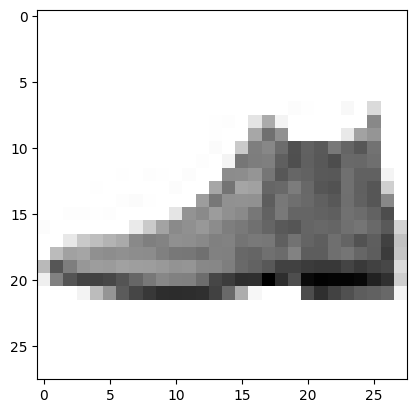

In [ ]:
plt.imshow(x_test[0].reshape(28,28), cmap = 'gray_r')
plt.show()

In [ ]:
# Label	Description
# 0	T-shirt/top
# 1	Trouser
# 2	Pullover
# 3	Dress
# 4	Coat
# 5	Sandal
# 6	Shirt
# 7	Sneaker
# 8	Bag
# 9	Ankle boot

In [ ]:
y_test[0]

9

In [ ]:
y_test_bin[0]

9

## 가중치 시각화

In [ ]:
model.layers

In [ ]:
conv = model.layers[0]

In [ ]:
print(conv.weights[0].shape) # 가중치
print(conv.weights[1].shape) # 절편

(3, 3, 1, 32)
(32,)


In [ ]:
conv_wght = conv.weights[0].numpy()

In [ ]:
conv_wght.shape

(3, 3, 1, 32)

In [ ]:
conv_wght.mean()

-0.024327934

In [ ]:
conv_wght.std()

0.26986712

In [ ]:
conv_wght.reshape(-1, 1)

array([[-8.60248879e-02],
       [ 2.99929474e-02],
       [-5.00425287e-02],
       [ 1.30609155e-01],
       [-1.38139337e-01],
       [-1.40166783e+00],
       [ 1.73112124e-01],
       [-8.28163028e-02],
       [-2.34749466e-02],
       [-3.66492290e-03],
       [ 1.22007318e-01],
       [ 1.38736710e-01],
       [ 6.89391419e-02],
       [ 3.28776911e-02],
       [ 4.51023877e-02],
       [ 1.35797858e-01],
       [-3.88728738e-01],
       [-3.86999995e-01],
       [ 1.28867581e-01],
       [ 3.89227778e-01],
       [-2.93015927e-01],
       [-1.27053767e-01],
       [ 1.82502389e-01],
       [-1.22225821e-01],
       [-1.74672335e-01],
       [ 2.21719742e-01],
       [-1.96327388e-01],
       [ 9.85701308e-02],
       [ 8.72832611e-02],
       [-5.16098924e-02],
       [ 4.96937893e-02],
       [ 7.32697099e-02],
       [ 3.97647396e-02],
       [ 1.98527709e-01],
       [-1.70000896e-01],
       [ 2.77365535e-01],
       [ 1.70774683e-01],
       [-1.60293734e+00],
       [ 2.7

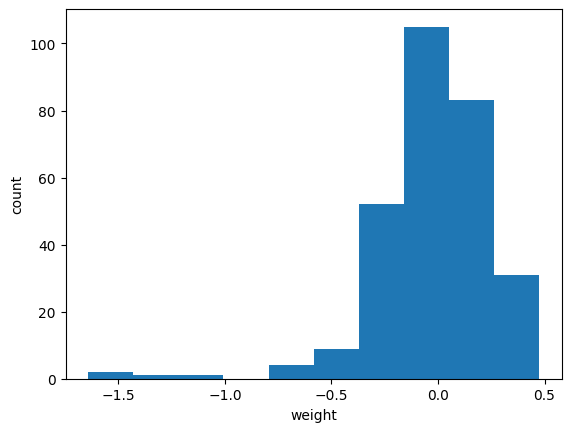

In [ ]:
plt.hist(conv_wght.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

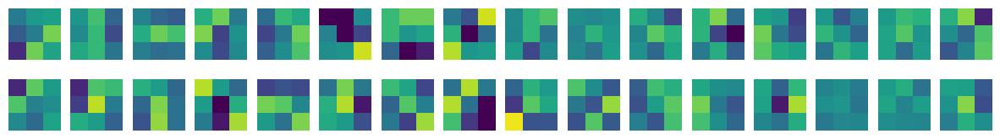

In [ ]:
# 가중치 시각화
fig, ax = plt.subplots(2, 16, figsize = (15, 2))
for i in range(2):
  for j in range(16):
    ax[i, j].imshow(conv_wght[:,:,0,i*16 + j], vmin = - 0.5, vmax = 0.5)
    ax[i, j].axis('off')
plt.show()

In [ ]:
# 훈련하지 않은 합성곱층
no_train_model = keras.Sequential()
no_train_model.add(keras.layers.Conv2D(32, kernel_size = (3, 3), activation = 'relu',
                                       padding = 'same', input_shape = (28,28,1)))

In [ ]:
no_train_model.layers

In [ ]:
no_train_conv = no_train_model.layers[0]

In [ ]:
print(no_train_conv.weights[0].shape)
print(no_train_conv.weights[1].shape)

(3, 3, 1, 32)
(32,)


In [ ]:
no_train_conv_wght = no_train_conv.weights[0].numpy()

In [ ]:
no_train_conv_wght.shape

(3, 3, 1, 32)

In [ ]:
no_train_conv_wght.mean()

-0.003806193

In [ ]:
no_train_conv_wght.std()

0.08121664

In [ ]:
no_train_conv_wght.reshape(-1, 1)

array([[ 0.0502066 ],
       [ 0.07732435],
       [-0.04666294],
       [-0.11226511],
       [ 0.02551432],
       [ 0.0111015 ],
       [ 0.01105331],
       [-0.09071886],
       [-0.0237693 ],
       [ 0.07928747],
       [ 0.02020435],
       [-0.14185645],
       [ 0.02012396],
       [ 0.11165123],
       [-0.02347773],
       [-0.13413553],
       [-0.04411928],
       [-0.10320668],
       [-0.03192008],
       [ 0.1188526 ],
       [ 0.083893  ],
       [ 0.04121564],
       [-0.09967613],
       [ 0.02493984],
       [-0.04062418],
       [ 0.02302188],
       [-0.00369871],
       [-0.08779627],
       [ 0.00735702],
       [-0.06118269],
       [-0.05885404],
       [ 0.07926036],
       [ 0.00762461],
       [-0.09643108],
       [ 0.0206334 ],
       [-0.05550998],
       [-0.01581074],
       [ 0.00323062],
       [-0.0861217 ],
       [ 0.12676819],
       [-0.13600929],
       [ 0.11039285],
       [-0.12827173],
       [ 0.0472378 ],
       [-0.05366193],
       [ 0

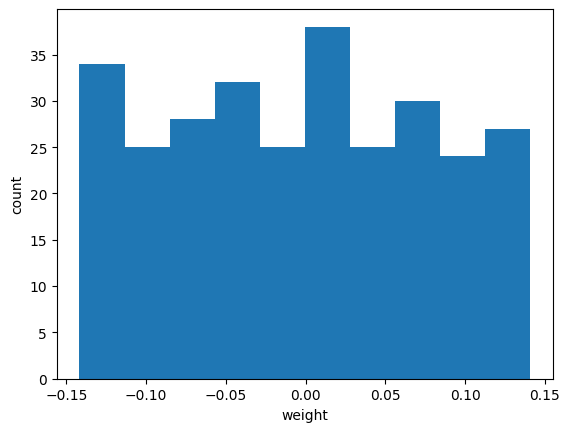

In [ ]:
plt.hist(no_train_conv_wght.reshape(-1, 1))
plt.xlabel('weight')
plt.ylabel('count')
plt.show()

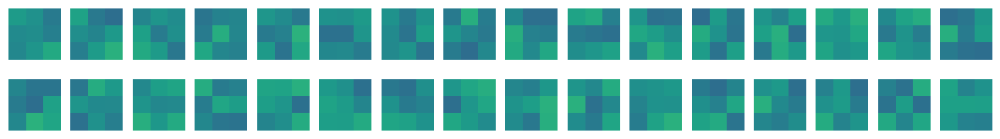

In [ ]:
# 가중치 시각화
fig, ax = plt.subplots(2, 16, figsize = (15, 2))
for i in range(2):
  for j in range(16):
    ax[i, j].imshow(no_train_conv_wght[:,:,0,i*16 + j], vmin = - 0.5, vmax = 0.5)
    ax[i, j].axis('off')
plt.show()

## 특성맵 시각화

In [ ]:
# 함수형 API 이용하여 첫번째 합성곱층, 풀링층
conv1 = keras.layers.Conv2D(32, kernel_size = (3,3), activation = 'relu', padding = 'same')
maxp1 = keras.layers.MaxPool2D(pool_size = (2, 2))

In [ ]:
inputs = keras.Input(shape = (28,28,1))

In [ ]:
conv1_layer = conv1(inputs)

In [ ]:
outputs = maxp1(conv1_layer)

In [ ]:
model = keras.Model(inputs, outputs)

In [ ]:
model.layers

In [ ]:
model.input

<KerasTensor: shape=(None, 28, 28, 1) dtype=float32 (created by layer 'input_1')>

In [ ]:
model.layers[1].output

<KerasTensor: shape=(None, 28, 28, 32) dtype=float32 (created by layer 'conv2d_5')>

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.fashion_mnist.load_data()

In [ ]:
x_train_scale = x_train.reshape(-1, 28, 28, 1) / 255

In [ ]:
# 검증 데이터 분할
from sklearn.model_selection import train_test_split
x_train_scale_sub, x_train_scale_val, y_train_sub, y_train_val = train_test_split(x_train_scale,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)

### 모델 만들기

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32, kernel_size = (3, 3), activation = 'relu', padding = 'same',
                              input_shape = (28,28,1)))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Conv2D(64, kernel_size = (3, 3), activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(pool_size = (2, 2)))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv2d_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2, restore_best_weights=True)

In [ ]:
history = model.fit(x_train_scale_sub, y_train_sub, epochs = 20,
                    validation_data = (x_train_scale_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/20
1500/1500 [==============================] - 87s 57ms/step - loss: 0.5147 - accuracy: 0.8139 - val_loss: 0.3251 - val_accuracy: 0.8791
Epoch 2/20
   3/1500 [..............................] - ETA: 50s - loss: 0.3994 - accuracy: 0.8958 

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1500/1500 [==============================] - 62s 42ms/step - loss: 0.3480 - accuracy: 0.8750 - val_loss: 0.2744 - val_accuracy: 0.8978
Epoch 3/20
1500/1500 [==============================] - 78s 52ms/step - loss: 0.3010 - accuracy: 0.8918 - val_loss: 0.2552 - val_accuracy: 0.9064
Epoch 4/20
1500/1500 [==============================] - 66s 44ms/step - loss: 0.2686 - accuracy: 0.9026 - val_loss: 0.2416 - val_accuracy: 0.9085
Epoch 5/20
1500/1500 [==============================] - 64s 43ms/step - loss: 0.2431 - accuracy: 0.9122 - val_loss: 0.2344 - val_accuracy: 0.9119
Epoch 6/20
1500/1500 [==============================] - 62s 41ms/step - loss: 0.2217 - accuracy: 0.9175 - val_loss: 0.2199 - val_accuracy: 0.9170
Epoch 7/20
1500/1500 [==============================] - 63s 42ms/step - loss: 0.2052 - accuracy: 0.9244 - val_loss: 0.2273 - val_accuracy: 0.9179
Epoch 8/20
1500/1500 [==============================] - 62s 41ms/step - loss: 0.1896 - accuracy: 0.9301 - val_loss: 0.2281 - val_accura

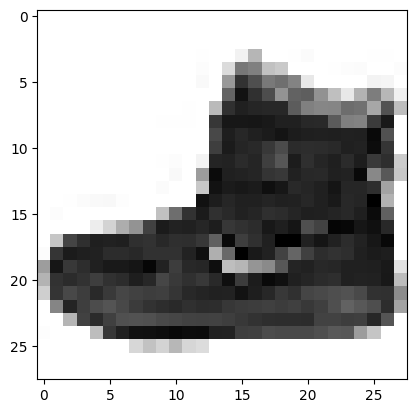

In [ ]:
plt.imshow(x_train[0], cmap = 'gray_r')
plt.show()

In [ ]:
model.layers

In [ ]:
model.input

<KerasTensor: shape=(None, 28, 28, 1) dtype=float32 (created by layer 'conv2d_6_input')>

In [ ]:
model.layers[0].output

<KerasTensor: shape=(None, 28, 28, 32) dtype=float32 (created by layer 'conv2d_6')>

In [ ]:
cnn1 = keras.Model(model.input, model.layers[0].output)

In [ ]:
inputs = x_train[0:1].reshape(-1, 28, 28, 1) / 255

In [ ]:
feature_map = cnn1.predict(inputs)

1/1 [==============================] - 0s 54ms/step


In [ ]:
feature_map.shape

(1, 28, 28, 32)

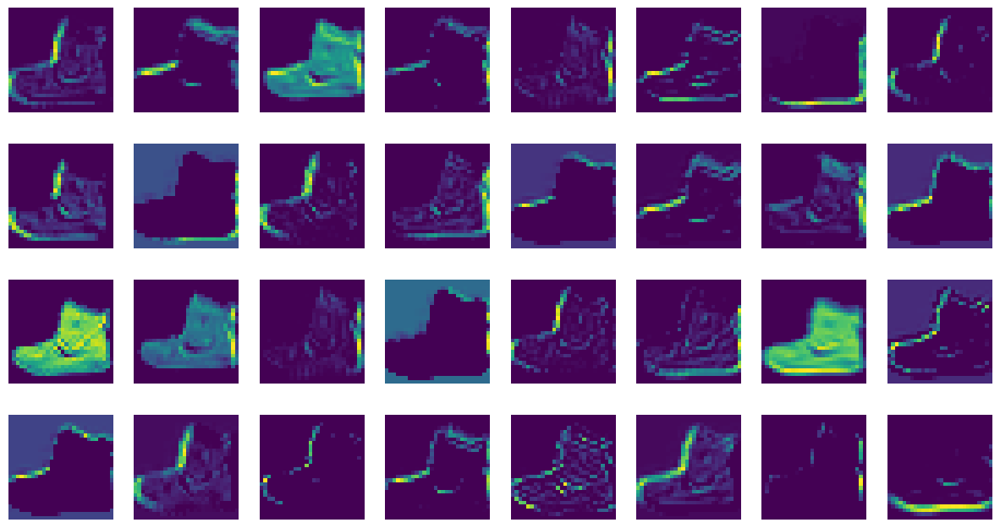

In [ ]:
fig, ax = plt.subplots(4, 8, figsize = (15, 8))
for i in range(4):
  for j in range(8):
    ax[i, j].imshow(feature_map[0,:,:,i*8 + j])
    ax[i, j].axis('off')
plt.show()

In [ ]:
model.layers

In [ ]:
cnn2 = keras.Model(model.input, model.layers[2].output)

In [ ]:
inputs = x_train[0:1].reshape(-1, 28, 28, 1) / 255

In [ ]:
feature_map = cnn2.predict(inputs)

1/1 [==============================] - 0s 61ms/step


In [ ]:
feature_map.shape

(1, 14, 14, 64)

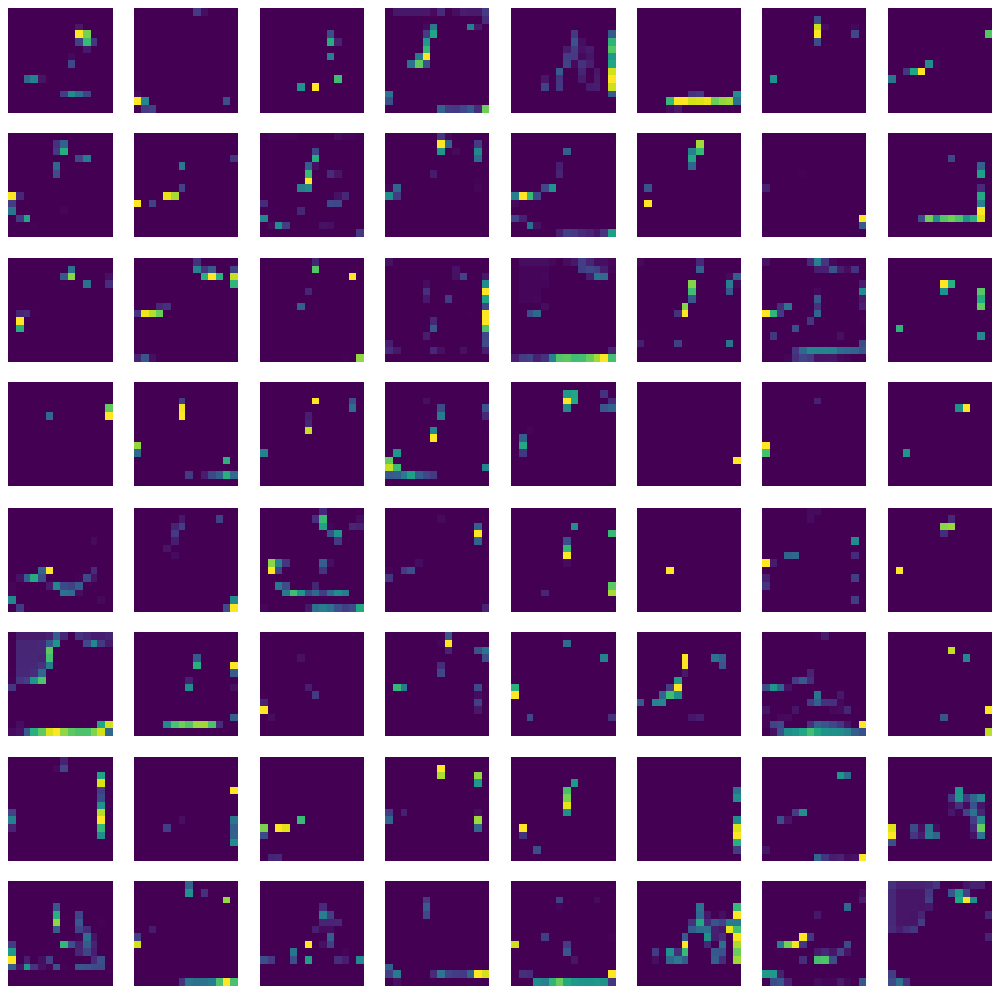

In [ ]:
fig, ax = plt.subplots(8, 8, figsize = (15, 15))
for i in range(8):
  for j in range(8):
    ax[i, j].imshow(feature_map[0,:,:,i*8 + j])
    ax[i, j].axis('off')
plt.show()

# 2차원 합성곱 신경망 모델 - cifar10 (같이 해보기)

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 [==============================] - 3s 0us/step


In [ ]:
(x_train, y_train), (x_test, y_test)

((array([[[[ 59,  62,  63],
           [ 43,  46,  45],
           [ 50,  48,  43],
           ...,
           [158, 132, 108],
           [152, 125, 102],
           [148, 124, 103]],
  
          [[ 16,  20,  20],
           [  0,   0,   0],
           [ 18,   8,   0],
           ...,
           [123,  88,  55],
           [119,  83,  50],
           [122,  87,  57]],
  
          [[ 25,  24,  21],
           [ 16,   7,   0],
           [ 49,  27,   8],
           ...,
           [118,  84,  50],
           [120,  84,  50],
           [109,  73,  42]],
  
          ...,
  
          [[208, 170,  96],
           [201, 153,  34],
           [198, 161,  26],
           ...,
           [160, 133,  70],
           [ 56,  31,   7],
           [ 53,  34,  20]],
  
          [[180, 139,  96],
           [173, 123,  42],
           [186, 144,  30],
           ...,
           [184, 148,  94],
           [ 97,  62,  34],
           [ 83,  53,  34]],
  
          [[177, 144, 116],
           [16

In [ ]:
print(x_train.shape, y_train.shape)
# 이미지 5 만장, 가로 * 세로 * 깊이

(50000, 32, 32, 3) (50000, 1)


In [ ]:
print(x_test.shape, y_test.shape)
# 이미지 1 만장, 가로 * 세로 * 깊이

(10000, 32, 32, 3) (10000, 1)


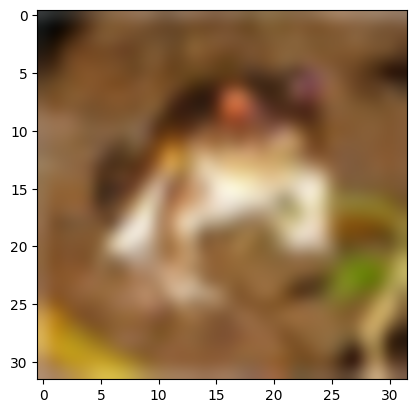

In [ ]:
plt.imshow(x_train[0], interpolation = 'bicubic')
plt.show()

In [ ]:
y_train[0]

array([6], dtype=uint8)

In [ ]:
# Label	Description
# 0	airplane
# 1	automobile
# 2	bird
# 3	cat
# 4	deer
# 5	dog
# 6	frog
# 7	horse
# 8	ship
# 9	truck

### 표준화

In [ ]:
x_train.shape

(50000, 32, 32, 3)

In [ ]:
print(np.mean(x_train))
print(np.std(x_train))

120.70756512369792
64.1500758911213


In [ ]:
x_mean = [0, 0, 0]
x_std = [0, 0, 0]

In [ ]:
x_train_scale = np.ones(x_train.shape)
x_test_scale = np.ones(x_test.shape)

In [ ]:
for i in range(3):
  x_mean[i] = np.mean(x_train[:,:,:,i])
  x_std[i] = np.std(x_train[:,:,:,i])

In [ ]:
for i in range(3):
  x_train_scale[:,:,:,i] = x_train[:,:,:,i] - x_mean[i]
  x_train_scale[:,:,:,i] = x_train_scale[:,:,:,i] / x_std[i]
  x_test_scale[:,:,:,i] = x_test[:,:,:,i] - x_mean[i]
  x_test_scale[:,:,:,i] = x_test_scale[:,:,:,i] / x_std[i]

In [ ]:
print(np.mean(x_train_scale))
print(np.std(x_train_scale))

4.91799193961621e-17
0.9999999999999996


In [ ]:
# 검증 데이터 분할
from sklearn.model_selection import train_test_split
x_train_scale_sub, x_train_scale_val, y_train_sub, y_train_val = train_test_split(x_train_scale,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)
print(x_train_scale.shape)
print(x_train_scale_sub.shape)
print(x_train_scale_val.shape)

(50000, 32, 32, 3)
(40000, 32, 32, 3)
(10000, 32, 32, 3)


## 모델 만들기

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (32,32,3)))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
3 * 3 * 3 * 32 + 32

896

In [ ]:
32 * 3 * 3 * 64 + 64

18496

In [ ]:
model.summary()

Model: "sequential_9"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 32, 32, 32)        896       
                                                                 
 max_pooling2d_7 (MaxPoolin  (None, 16, 16, 32)        0         
 g2D)                                                            
                                                                 
 conv2d_9 (Conv2D)           (None, 16, 16, 64)        18496     
                                                                 
 max_pooling2d_8 (MaxPoolin  (None, 8, 8, 64)          0         
 g2D)                                                            
                                                                 
 flatten_7 (Flatten)         (None, 4096)              0         
                                                                 
 dense_16 (Dense)            (None, 100)              

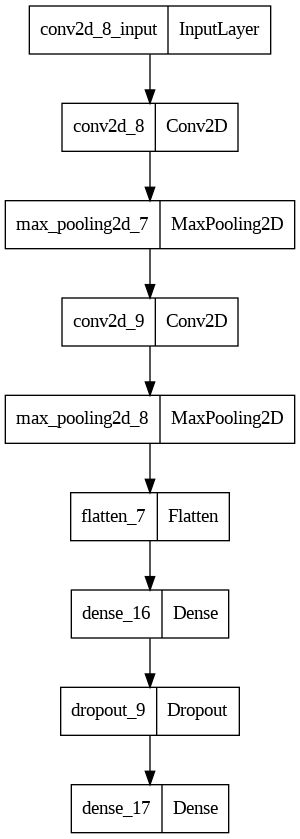

In [ ]:
keras.utils.plot_model(model)

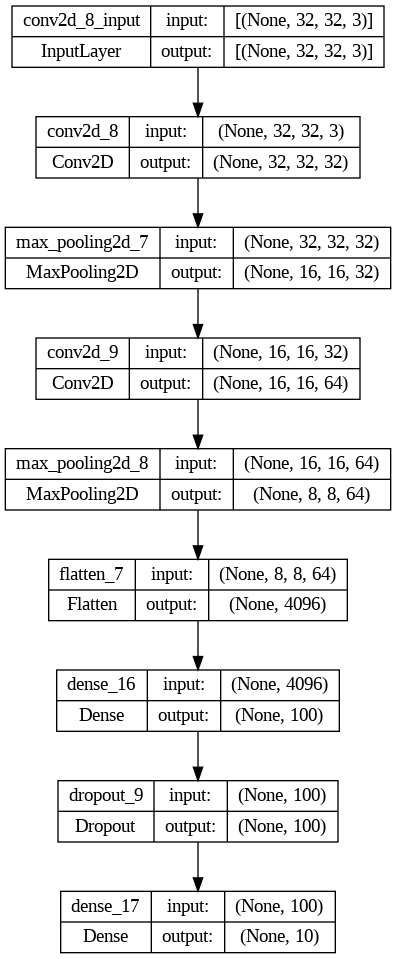

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv2d_color_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2, restore_best_weights=True)

In [ ]:
history = model.fit(x_train_scale_sub, y_train_sub, epochs = 20,
                    validation_data = (x_train_scale_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/20
1250/1250 [==============================] - 90s 71ms/step - loss: 1.5569 - accuracy: 0.4376 - val_loss: 1.1631 - val_accuracy: 0.5922
Epoch 2/20
1250/1250 [==============================] - 71s 57ms/step - loss: 1.2107 - accuracy: 0.5683 - val_loss: 1.0171 - val_accuracy: 0.6388
Epoch 3/20
1250/1250 [==============================] - 71s 57ms/step - loss: 1.0791 - accuracy: 0.6173 - val_loss: 0.9533 - val_accuracy: 0.6627
Epoch 4/20
1250/1250 [==============================] - 71s 57ms/step - loss: 0.9899 - accuracy: 0.6496 - val_loss: 0.8945 - val_accuracy: 0.6876
Epoch 5/20
1250/1250 [==============================] - 70s 56ms/step - loss: 0.9186 - accuracy: 0.6760 - val_loss: 0.8949 - val_accuracy: 0.6868
Epoch 6/20
1250/1250 [==============================] - 71s 56ms/step - loss: 0.8548 - accuracy: 0.6960 - val_loss: 0.8622 - val_accuracy: 0.6940
Epoch 7/20
1250/1250 [==============================] - 68s 54ms/step - loss: 0.7998 - accuracy: 0.7134 - val_loss: 0.8539 -

In [ ]:
print(early_stopping_cb.stopped_epoch)

8


In [ ]:
print(history)

In [ ]:
print(history.history)

{'loss': [1.5569084882736206, 1.2106666564941406, 1.0790529251098633, 0.98992919921875, 0.9186378717422485, 0.8547686338424683, 0.7997666597366333, 0.7560296654701233, 0.7053309082984924], 'accuracy': [0.4375999867916107, 0.5682500004768372, 0.6173499822616577, 0.649649977684021, 0.6759750247001648, 0.6960499882698059, 0.7134249806404114, 0.7313500046730042, 0.74652498960495], 'val_loss': [1.163129448890686, 1.0170644521713257, 0.9533321261405945, 0.8944594860076904, 0.8948830962181091, 0.8622189164161682, 0.8539310693740845, 0.8729321360588074, 0.8864022493362427], 'val_accuracy': [0.592199981212616, 0.6388000249862671, 0.6626999974250793, 0.6876000165939331, 0.6868000030517578, 0.6940000057220459, 0.7037000060081482, 0.70169997215271, 0.7010999917984009]}


In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


## 검증손실

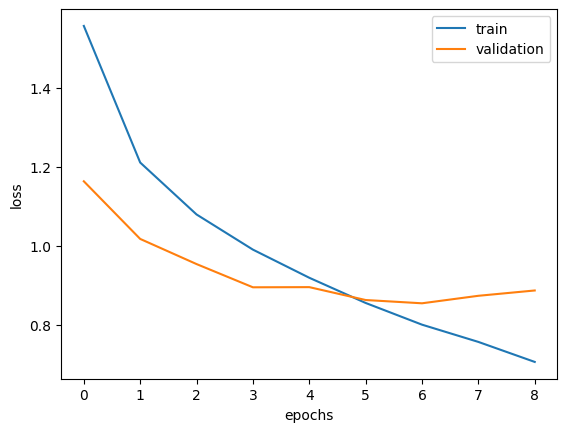

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
6,0.799767,0.713425,0.853931,0.7037


In [ ]:
model.evaluate(x_train_scale_val, y_train_val)

313/313 [==============================] - 6s 20ms/step - loss: 0.8539 - accuracy: 0.7037


[0.8539310693740845, 0.7037000060081482]

## 최종 모델

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(32, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (32,32,3)))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(64, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
opt_epoch = history_df[history_df['val_loss'] == min(history_df['val_loss'])].index[0]
opt_epoch = opt_epoch + 1

In [ ]:
model.fit(x_train_scale, y_train, epochs = opt_epoch)

Epoch 1/7
1563/1563 [==============================] - 87s 55ms/step - loss: 1.4648 - accuracy: 0.4766
Epoch 2/7
1563/1563 [==============================] - 81s 52ms/step - loss: 1.1276 - accuracy: 0.6020
Epoch 3/7
1563/1563 [==============================] - 81s 52ms/step - loss: 0.9926 - accuracy: 0.6493
Epoch 4/7
1563/1563 [==============================] - 83s 53ms/step - loss: 0.9155 - accuracy: 0.6806
Epoch 5/7
1563/1563 [==============================] - 79s 51ms/step - loss: 0.8439 - accuracy: 0.7025
Epoch 6/7
1563/1563 [==============================] - 81s 52ms/step - loss: 0.7887 - accuracy: 0.7211
Epoch 7/7
1563/1563 [==============================] - 82s 53ms/step - loss: 0.7396 - accuracy: 0.7375


In [ ]:
# 예측
y_test_pred = model.predict(x_test_scale)

313/313 [==============================] - 5s 14ms/step


In [ ]:
y_test_bin = np.argmax(y_test_pred, axis = 1)

In [ ]:
y_test_bin

array([3, 8, 0, ..., 5, 0, 7])

In [ ]:
y_test

array([[3],
       [8],
       [8],
       ...,
       [5],
       [1],
       [7]], dtype=uint8)

In [ ]:
y_test.reshape(-1)

array([3, 8, 8, ..., 5, 1, 7], dtype=uint8)

In [ ]:
np.mean(y_test.reshape(-1) == y_test_bin)

0.7039

In [ ]:
model.evaluate(x_test_scale, y_test)

313/313 [==============================] - 6s 19ms/step - loss: 0.8660 - accuracy: 0.7039


[0.8659747242927551, 0.7038999795913696]

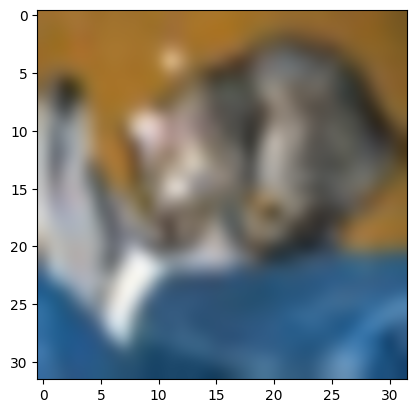

In [ ]:
plt.imshow(x_test[0], interpolation = 'bicubic')
plt.show()

In [ ]:
y_test[0]

array([3], dtype=uint8)

In [ ]:
y_test_bin[0]

3

# 2차원 합성곱 신경망 모델 - cifar10 (혼자 해보기)

In [ ]:
(x_train, y_train), (x_test, y_test) = keras.datasets.cifar10.load_data()

170498071/170498071 [==============================] - 3s 0us/step


In [ ]:
(x_train, y_train), (x_test, y_test)

((array([[[[ 59,  62,  63],
           [ 43,  46,  45],
           [ 50,  48,  43],
           ...,
           [158, 132, 108],
           [152, 125, 102],
           [148, 124, 103]],
  
          [[ 16,  20,  20],
           [  0,   0,   0],
           [ 18,   8,   0],
           ...,
           [123,  88,  55],
           [119,  83,  50],
           [122,  87,  57]],
  
          [[ 25,  24,  21],
           [ 16,   7,   0],
           [ 49,  27,   8],
           ...,
           [118,  84,  50],
           [120,  84,  50],
           [109,  73,  42]],
  
          ...,
  
          [[208, 170,  96],
           [201, 153,  34],
           [198, 161,  26],
           ...,
           [160, 133,  70],
           [ 56,  31,   7],
           [ 53,  34,  20]],
  
          [[180, 139,  96],
           [173, 123,  42],
           [186, 144,  30],
           ...,
           [184, 148,  94],
           [ 97,  62,  34],
           [ 83,  53,  34]],
  
          [[177, 144, 116],
           [16

In [ ]:
print(x_train.shape, y_train.shape)
# 이미지 5 만장, 가로 * 세로 * 깊이

(50000, 32, 32, 3) (50000, 1)


In [ ]:
print(x_test.shape, y_test.shape)
# 이미지 1 만장, 가로 * 세로 * 깊이

(10000, 32, 32, 3) (10000, 1)


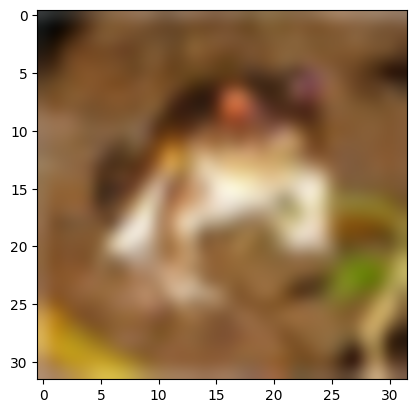

In [ ]:
plt.imshow(x_train[0], interpolation = 'bicubic')
plt.show()

In [ ]:
y_train[0]

array([6], dtype=uint8)

### 표준화

In [ ]:
x_train.shape

(50000, 32, 32, 3)

In [ ]:
print(np.mean(x_train))
print(np.std(x_train))

120.70756512369792
64.1500758911213


In [ ]:
x_mean = [0, 0, 0]
x_std = [0, 0, 0]

In [ ]:
x_train_scale = np.ones(x_train.shape)
x_test_scale = np.ones(x_test.shape)

In [ ]:
for i in range(3):
  x_mean[i] = np.mean(x_train[:,:,:,i])
  x_std[i] = np.std(x_train[:,:,:,i])

In [ ]:
for i in range(3):
  x_train_scale[:,:,:,i] = x_train[:,:,:,i] - x_mean[i]
  x_train_scale[:,:,:,i] = x_train_scale[:,:,:,i] / x_std[i]
  x_test_scale[:,:,:,i] = x_test[:,:,:,i] - x_mean[i]
  x_test_scale[:,:,:,i] = x_test_scale[:,:,:,i] / x_std[i]

In [ ]:
print(np.mean(x_train_scale))
print(np.std(x_train_scale))

4.91799193961621e-17
0.9999999999999996


In [ ]:
# 검증 데이터 분할
from sklearn.model_selection import train_test_split
x_train_scale_sub, x_train_scale_val, y_train_sub, y_train_val = train_test_split(x_train_scale,
                                                                                  y_train,
                                                                                  test_size = 0.2,
                                                                                  random_state=42)
print(x_train_scale.shape)
print(x_train_scale_sub.shape)
print(x_train_scale_val.shape)

(50000, 32, 32, 3)
(40000, 32, 32, 3)
(10000, 32, 32, 3)


## 모델 만들기

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(64, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (x_train_scale.shape[1],
                                             x_train_scale.shape[2],
                                             x_train_scale.shape[3])))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(128, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(256, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(50, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
3 * 3 * 3 * 64 + 64

1792

In [ ]:
64 * 3 * 3 * 128 + 128

73856

In [ ]:
128 * 3 * 3 * 256 + 256

295168

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 32, 32, 64)        1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 16, 16, 64)        0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 16, 16, 128)       73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 8, 8, 128)         0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 256)         295168    
                                                                 
 max_pooling2d_2 (MaxPoolin  (None, 4, 4, 256)         0

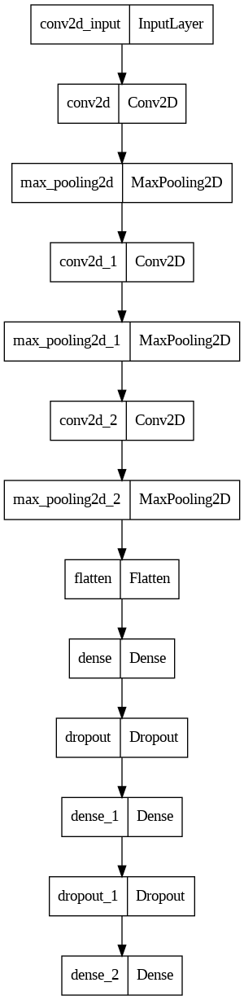

In [ ]:
keras.utils.plot_model(model)

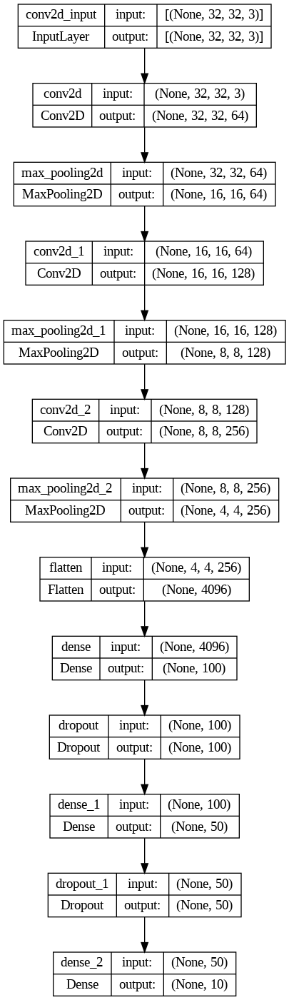

In [ ]:
keras.utils.plot_model(model, show_shapes=True)

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
checkpoint_cb = keras.callbacks.ModelCheckpoint('./best_conv2d_color_model.h5',
                                                save_best_only = True)

In [ ]:
early_stopping_cb = keras.callbacks.EarlyStopping(patience = 2, restore_best_weights=True)

In [ ]:
history = model.fit(x_train_scale_sub, y_train_sub, epochs = 20,
                    validation_data = (x_train_scale_val, y_train_val),
                    callbacks = [checkpoint_cb, early_stopping_cb])

Epoch 1/20
1250/1250 [==============================] - 15s 7ms/step - loss: 1.7004 - accuracy: 0.3740 - val_loss: 1.2400 - val_accuracy: 0.5545
Epoch 2/20
  23/1250 [..............................] - ETA: 5s - loss: 1.4400 - accuracy: 0.4633

/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1250/1250 [==============================] - 10s 8ms/step - loss: 1.2788 - accuracy: 0.5501 - val_loss: 1.0280 - val_accuracy: 0.6305
Epoch 3/20
1250/1250 [==============================] - 9s 7ms/step - loss: 1.0934 - accuracy: 0.6235 - val_loss: 0.9180 - val_accuracy: 0.6783
Epoch 4/20
1250/1250 [==============================] - 8s 6ms/step - loss: 0.9794 - accuracy: 0.6686 - val_loss: 0.8781 - val_accuracy: 0.6994
Epoch 5/20
1250/1250 [==============================] - 7s 5ms/step - loss: 0.8950 - accuracy: 0.6956 - val_loss: 0.8393 - val_accuracy: 0.7127
Epoch 6/20
1250/1250 [==============================] - 8s 7ms/step - loss: 0.8284 - accuracy: 0.7216 - val_loss: 0.8134 - val_accuracy: 0.7308
Epoch 7/20
1250/1250 [==============================] - 7s 6ms/step - loss: 0.7702 - accuracy: 0.7394 - val_loss: 0.8241 - val_accuracy: 0.7271
Epoch 8/20
1250/1250 [==============================] - 8s 6ms/step - loss: 0.7221 - accuracy: 0.7584 - val_loss: 0.7903 - val_accuracy: 0.7357
Ep

In [ ]:
print(early_stopping_cb.stopped_epoch)

9


In [ ]:
print(history)

In [ ]:
print(history.history)

{'loss': [1.7003613710403442, 1.27884042263031, 1.093361496925354, 0.9794285297393799, 0.8949525356292725, 0.8284483551979065, 0.7702200412750244, 0.7220752835273743, 0.6779457330703735, 0.6371369361877441], 'accuracy': [0.37404999136924744, 0.5500749945640564, 0.6235499978065491, 0.6685500144958496, 0.6956499814987183, 0.7216249704360962, 0.7393500208854675, 0.758400022983551, 0.7725750207901001, 0.7857249975204468], 'val_loss': [1.2399952411651611, 1.0280057191848755, 0.9180058836936951, 0.8781412243843079, 0.8392671942710876, 0.8134430646896362, 0.8240984082221985, 0.7902700304985046, 0.7988752722740173, 0.817407488822937], 'val_accuracy': [0.5544999837875366, 0.6305000185966492, 0.6783000230789185, 0.699400007724762, 0.7127000093460083, 0.7307999730110168, 0.7271000146865845, 0.7357000112533569, 0.7439000010490417, 0.7391999959945679]}


In [ ]:
print(history.history.keys())

dict_keys(['loss', 'accuracy', 'val_loss', 'val_accuracy'])


## 검증손실

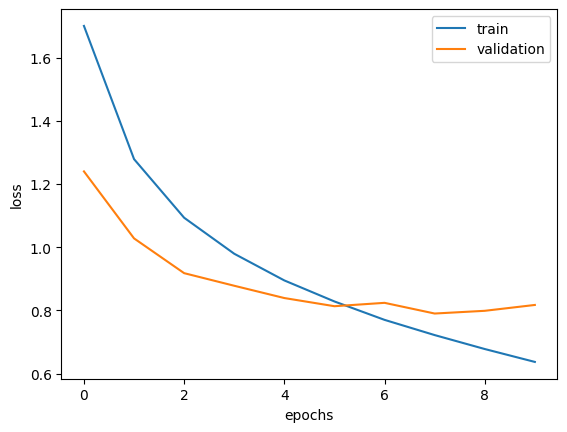

In [ ]:
# 손실곡선 - 손실값
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.xlabel('epochs')
plt.ylabel('loss')
plt.legend(['train', 'validation'])
plt.show()

In [ ]:
history_df = pd.DataFrame(history.history)
history_df[history_df['val_loss'] == min(history_df['val_loss'])]

,loss,accuracy,val_loss,val_accuracy
7,0.722075,0.7584,0.79027,0.7357


In [ ]:
model.evaluate(x_train_scale_val, y_train_val)

313/313 [==============================] - 1s 3ms/step - loss: 0.7903 - accuracy: 0.7357


[0.7902700304985046, 0.7357000112533569]

## 최종 모델

In [ ]:
model = keras.Sequential()
model.add(keras.layers.Conv2D(64, kernel_size = 3, activation = 'relu', padding = 'same',
                              input_shape = (x_train_scale.shape[1],
                                             x_train_scale.shape[2],
                                             x_train_scale.shape[3])))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(128, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Conv2D(256, kernel_size = 3, activation = 'relu', padding = 'same'))
model.add(keras.layers.MaxPool2D(2))
model.add(keras.layers.Flatten())
model.add(keras.layers.Dense(100, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(50, activation = 'relu'))
model.add(keras.layers.Dropout(0.4))
model.add(keras.layers.Dense(10, activation = 'softmax'))

In [ ]:
model.compile(optimizer = 'adam', loss = 'sparse_categorical_crossentropy', metrics = 'accuracy')

In [ ]:
opt_epoch = history_df[history_df['val_loss'] == min(history_df['val_loss'])].index[0]
opt_epoch = opt_epoch + 1

In [ ]:
model.fit(x_train_scale, y_train, epochs = opt_epoch)

Epoch 1/8
1563/1563 [==============================] - 12s 7ms/step - loss: 1.6564 - accuracy: 0.3911
Epoch 2/8
1563/1563 [==============================] - 10s 6ms/step - loss: 1.2390 - accuracy: 0.5687
Epoch 3/8
1563/1563 [==============================] - 10s 6ms/step - loss: 1.0672 - accuracy: 0.6328
Epoch 4/8
1563/1563 [==============================] - 10s 7ms/step - loss: 0.9544 - accuracy: 0.6741
Epoch 5/8
1563/1563 [==============================] - 10s 6ms/step - loss: 0.8858 - accuracy: 0.7004
Epoch 6/8
1563/1563 [==============================] - 10s 7ms/step - loss: 0.8174 - accuracy: 0.7239
Epoch 7/8
1563/1563 [==============================] - 9s 6ms/step - loss: 0.7714 - accuracy: 0.7403
Epoch 8/8
1563/1563 [==============================] - 10s 6ms/step - loss: 0.7208 - accuracy: 0.7565


In [ ]:
# 예측
y_test_pred = model.predict(x_test_scale)

313/313 [==============================] - 1s 2ms/step


In [ ]:
y_test_bin = np.argmax(y_test_pred, axis = 1)

In [ ]:
y_test.reshape(-1)

array([3, 8, 8, ..., 5, 1, 7], dtype=uint8)

In [ ]:
np.mean(y_test.reshape(-1) == y_test_bin)

0.7435

In [ ]:
model.evaluate(x_test_scale, y_test)

313/313 [==============================] - 2s 4ms/step - loss: 0.7789 - accuracy: 0.7435


[0.7788540720939636, 0.7434999942779541]

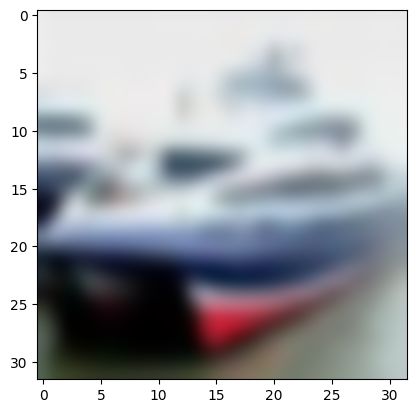

In [ ]:
plt.imshow(x_test[1], interpolation = 'bicubic')
plt.show()

In [ ]:
y_test[1]

array([8], dtype=uint8)

In [ ]:
y_test_bin[1]

8

# 시계열 데이터 처리

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/time.csv')
df.head()

,Yr_Mo_Dy,RPT,VAL,ROS,KIL,SHA,BIR,DUB,CLA,MUL,CLO,BEL,MAL
0,2061-01-01,15.04,14.96,13.17,9.29,NaN,9.87,13.67,10.25,10.83,12.58,18.50,15.04
1,2061-01-02,14.71,NaN,10.83,6.50,12.62,7.67,11.50,10.04,9.79,9.67,17.54,13.83
2,2061-01-03,18.50,16.88,12.33,10.13,11.17,6.17,11.25,NaN,8.50,7.67,12.75,12.71
3,2061-01-04,10.58,6.63,11.75,4.58,4.54,2.88,8.63,1.79,5.83,5.88,5.46,10.88
4,2061-01-05,13.33,13.25,11.42,6.17,10.71,8.21,11.92,6.54,10.92,10.34,12.92,11.83


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6574 entries, 0 to 6573
Data columns (total 13 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   Yr_Mo_Dy  6574 non-null   object 
 1   RPT       6568 non-null   float64
 2   VAL       6571 non-null   float64
 3   ROS       6572 non-null   float64
 4   KIL       6569 non-null   float64
 5   SHA       6572 non-null   float64
 6   BIR       6574 non-null   float64
 7   DUB       6571 non-null   float64
 8   CLA       6572 non-null   float64
 9   MUL       6571 non-null   float64
 10  CLO       6573 non-null   float64
 11  BEL       6574 non-null   float64
 12  MAL       6570 non-null   float64
dtypes: float64(12), object(1)
memory usage: 667.8+ KB


In [ ]:
df.Yr_Mo_Dy = pd.to_datetime(df.Yr_Mo_Dy)
df.Yr_Mo_Dy

0      2061-01-01
1      2061-01-02
2      2061-01-03
3      2061-01-04
4      2061-01-05
          ...    
6569   1978-12-27
6570   1978-12-28
6571   1978-12-29
6572   1978-12-30
6573   1978-12-31
Name: Yr_Mo_Dy, Length: 6574, dtype: datetime64[ns]

In [ ]:
df.Yr_Mo_Dy.dt.year.unique()

array([2061, 2062, 2063, 2064, 2065, 2066, 2067, 2068, 2069, 2070, 1971,
       1972, 1973, 1974, 1975, 1976, 1977, 1978], dtype=int32)

In [ ]:
def modify_year(x):
    import datetime
    year = x.year - 100 if x.year >= 2061 else x.year
    return pd.to_datetime(datetime.date(year, x.month, x.day))

df['Yr_Mo_Dy'] = df['Yr_Mo_Dy'].apply(modify_year)
df['Yr_Mo_Dy']

0      1961-01-01
1      1961-01-02
2      1961-01-03
3      1961-01-04
4      1961-01-05
          ...    
6569   1978-12-27
6570   1978-12-28
6571   1978-12-29
6572   1978-12-30
6573   1978-12-31
Name: Yr_Mo_Dy, Length: 6574, dtype: datetime64[ns]

In [ ]:
df.groupby(df.Yr_Mo_Dy.dt.year).mean()

,Yr_Mo_Dy,RPT,VAL,ROS,KIL,SHA,BIR,DUB,CLA,MUL,CLO,BEL,MAL
Yr_Mo_Dy,,,,,,,,,,,,,
1961,1961-07-02 00:00:00,12.299583,10.351796,11.362369,6.958227,10.881763,7.729726,9.733923,8.858788,8.647652,9.835577,13.502795,13.680773
1962,1962-07-02 00:00:00,12.246923,10.110438,11.732712,6.960440,10.657918,7.393068,11.020712,8.793753,8.316822,9.676247,12.930685,14.323956
1963,1963-07-02 00:00:00,12.813452,10.836986,12.541151,7.330055,11.724110,8.434712,11.075699,10.336548,8.903589,10.224438,13.638877,14.999014
1964,1964-07-01 12:00:00,12.363661,10.920164,12.104372,6.787787,11.454481,7.570874,10.259153,9.467350,7.789016,10.207951,13.740546,14.910301
1965,1965-07-02 00:00:00,12.451370,11.075534,11.848767,6.858466,11.024795,7.478110,10.618712,8.879918,7.907425,9.918082,12.964247,15.591644
1966,1966-07-02 00:00:00,13.461973,11.557205,12.020630,7.345726,11.805041,7.793671,10.579808,8.835096,8.514438,9.768959,14.265836,16.307260
1967,1967-07-02 00:00:00,12.737151,10.990986,11.739397,7.143425,11.630740,7.368164,10.652027,9.325616,8.645014,9.547425,14.774548,17.135945
1968,1968-07-01 12:00:00,11.835628,10.468197,11.409754,6.477678,10.760765,6.067322,8.859180,8.255519,7.224945,7.832978,12.808634,15.017486
1969,1969-07-02 00:00:00,11.166356,9.723699,10.902000,5.767973,9.873918,6.189973,8.564493,7.711397,7.924521,7.754384,12.621233,15.762904


In [ ]:
df['weekday'] = df.Yr_Mo_Dy.dt.weekday
df['weekday']

0       6
1       0
2       1
3       2
4       3
       ..
6569    2
6570    3
6571    4
6572    5
6573    6
Name: weekday, Length: 6574, dtype: int32

In [ ]:
df['Weekend']  = df['weekday'].map(lambda x: 1 if x in [5,6] else 0)
df['Weekend']

0       1
1       0
2       0
3       0
4       0
       ..
6569    0
6570    0
6571    0
6572    1
6573    1
Name: Weekend, Length: 6574, dtype: int64

In [ ]:
df.groupby(df.Yr_Mo_Dy.dt.month).mean(numeric_only=True)

,RPT,VAL,ROS,KIL,SHA,BIR,DUB,CLA,MUL,CLO,BEL,MAL,weekday,Weekend
Yr_Mo_Dy,,,,,,,,,,,,,,
1,14.847325,12.914560,13.299624,7.199498,11.667734,8.054839,11.819355,9.512047,9.543208,10.053566,14.550520,18.028763,2.989247,0.284946
2,13.710906,12.111122,12.879132,6.942411,11.551772,7.633858,11.206024,9.341437,9.313169,9.518051,13.728898,17.156142,3.005906,0.287402
3,13.158687,11.505842,12.648118,7.265907,11.554516,7.959409,11.310179,9.635896,9.700324,10.096953,13.810609,16.909317,3.000000,0.283154
4,12.555648,10.429759,12.204815,6.898037,10.677667,7.441389,10.221315,8.909056,8.930870,9.158019,12.664759,14.937611,3.011111,0.288889
5,11.724032,10.145619,11.550394,6.307487,10.224301,6.942061,8.797738,8.452903,8.040806,8.524857,12.767258,13.736039,2.982079,0.283154
6,10.451317,8.949704,10.361315,5.652278,9.529926,6.410093,8.009556,7.920796,7.639796,7.729185,12.246407,12.861818,3.007407,0.285185
7,9.992007,8.357778,9.349642,5.416935,9.302634,5.972348,7.843501,7.262760,7.544480,7.321416,11.676505,12.800789,3.001792,0.288530
8,10.213411,8.415143,9.993441,5.270681,8.901559,5.891057,7.772312,6.842025,7.240573,7.002783,11.110090,12.565943,2.991039,0.283154
9,11.458519,9.981002,10.756883,5.615176,9.766315,6.566222,8.609722,7.745677,7.610556,7.689278,12.686389,14.761963,3.009259,0.287037


In [ ]:
df.fillna(method='ffill').fillna(method='bfill')

,Yr_Mo_Dy,RPT,VAL,ROS,KIL,SHA,BIR,DUB,CLA,MUL,CLO,BEL,MAL,weekday,Weekend
0,1961-01-01,15.04,14.96,13.17,9.29,12.62,9.87,13.67,10.25,10.83,12.58,18.50,15.04,6,1
1,1961-01-02,14.71,14.96,10.83,6.50,12.62,7.67,11.50,10.04,9.79,9.67,17.54,13.83,0,0
2,1961-01-03,18.50,16.88,12.33,10.13,11.17,6.17,11.25,10.04,8.50,7.67,12.75,12.71,1,0
3,1961-01-04,10.58,6.63,11.75,4.58,4.54,2.88,8.63,1.79,5.83,5.88,5.46,10.88,2,0
4,1961-01-05,13.33,13.25,11.42,6.17,10.71,8.21,11.92,6.54,10.92,10.34,12.92,11.83,3,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6569,1978-12-27,17.58,16.96,17.62,8.08,13.21,11.67,14.46,15.59,14.04,14.00,17.21,40.08,2,0
6570,1978-12-28,13.21,5.46,13.46,5.00,8.12,9.42,14.33,16.25,15.25,18.05,21.79,41.46,3,0
6571,1978-12-29,14.00,10.29,14.42,8.71,9.71,10.54,19.17,12.46,14.50,16.42,18.88,29.58,4,0
6572,1978-12-30,18.50,14.04,21.29,9.13,12.75,9.71,18.08,12.87,12.46,12.12,14.67,28.79,5,1


In [ ]:
print(df.isnull().sum())
print(df.fillna(method='ffill').fillna(method='bfill').isnull().sum())

Yr_Mo_Dy    0
RPT         6
VAL         3
ROS         2
KIL         5
SHA         2
BIR         0
DUB         3
CLA         2
MUL         3
CLO         1
BEL         0
MAL         4
weekday     0
Weekend     0
dtype: int64
Yr_Mo_Dy    0
RPT         0
VAL         0
ROS         0
KIL         0
SHA         0
BIR         0
DUB         0
CLA         0
MUL         0
CLO         0
BEL         0
MAL         0
weekday     0
Weekend     0
dtype: int64


In [ ]:
df.groupby(df.Yr_Mo_Dy.dt.to_period('M')).mean(numeric_only=True)

,RPT,VAL,ROS,KIL,SHA,BIR,DUB,CLA,MUL,CLO,BEL,MAL,weekday,Weekend
Yr_Mo_Dy,,,,,,,,,,,,,,
1961-01,14.841333,11.988333,13.431613,7.736774,11.072759,8.588065,11.184839,9.245333,9.085806,10.107419,13.880968,14.703226,2.935484,0.290323
1961-02,16.269286,14.975357,14.441481,9.230741,13.852143,10.937500,11.890714,11.846071,11.821429,12.714286,18.583214,15.411786,3.000000,0.285714
1961-03,10.890000,11.296452,10.752903,7.284000,10.509355,8.866774,9.644194,9.829677,10.294138,11.251935,16.410968,15.720000,3.000000,0.258065
1961-04,10.722667,9.427667,9.998000,5.830667,8.435000,6.495000,6.925333,7.094667,7.342333,7.237000,11.147333,10.278333,3.166667,0.333333
1961-05,9.860968,8.850000,10.818065,5.905333,9.490323,6.574839,7.604000,8.177097,8.039355,8.499355,11.900323,12.011613,2.806452,0.258065
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1978-08,9.645161,8.259355,9.032258,4.502903,7.368065,5.935161,5.650323,5.417742,7.241290,5.536774,10.466774,12.054194,2.903226,0.258065
1978-09,10.913667,10.895000,10.635000,5.725000,10.372000,9.278333,10.790333,9.583000,10.069333,8.939000,15.680333,19.391333,3.100000,0.300000
1978-10,9.897742,8.670968,9.295806,4.721290,8.525161,6.774194,8.115484,7.337742,8.297742,8.243871,13.776774,17.150000,2.935484,0.290323


In [ ]:
df['RPT'].diff()

0        NaN
1      -0.33
2       3.79
3      -7.92
4       2.75
        ... 
6569    3.75
6570   -4.37
6571    0.79
6572    4.50
6573    1.83
Name: RPT, Length: 6574, dtype: float64

In [ ]:
# 테스트
for i in range(4):
  print(df['RPT'][i+1] - df['RPT'][i])

-0.3299999999999983
3.789999999999999
-7.92
2.75


In [ ]:
df['RPT'].head()

0    15.04
1    14.71
2    18.50
3    10.58
4    13.33
Name: RPT, dtype: float64

In [ ]:
df[['RPT']].rolling(7).mean()

,RPT
0,NaN
1,NaN
2,NaN
3,NaN
4,NaN
...,...
6569,11.868571
6570,11.904286
6571,13.017143
6572,13.285714


In [ ]:
# 테스트
print(df[['RPT']].head(7))
test = df[['RPT']].rolling(7).mean()
print(test.head(7))
print(df[['RPT']].head(7).mean())

     RPT
0  15.04
1  14.71
2  18.50
3  10.58
4  13.33
5  13.21
6  13.50
         RPT
0        NaN
1        NaN
2        NaN
3        NaN
4        NaN
5        NaN
6  14.124286
RPT    14.124286
dtype: float64


In [ ]:
df = pd.read_csv('/content/drive/MyDrive/lsda02/data/seoul.csv')
df.head()

,(년-월-일:시),PM10등급,PM10,PM2.5등급,PM2.5,오존등급,오존,이산화질소등급,이산화질소,일산화탄소등급,일산화탄소,아황산가스등급,아황산가스
0,2021-05-15:15,보통,47.0,보통,19.0,좋음,0.017,좋음,0.023,좋음,0.4,좋음,0.003
1,2021-05-15:14,보통,43.0,보통,20.0,좋음,0.024,좋음,0.019,좋음,0.3,좋음,0.003
2,2021-05-15:13,보통,34.0,보통,24.0,보통,0.035,좋음,0.017,좋음,0.4,좋음,0.004
3,2021-05-15:12,보통,41.0,보통,27.0,보통,0.037,좋음,0.020,좋음,0.4,좋음,0.004
4,2021-05-15:11,보통,51.0,보통,34.0,보통,0.033,좋음,0.023,좋음,0.4,좋음,0.005


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1239 entries, 0 to 1238
Data columns (total 13 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   (년-월-일:시)  1239 non-null   object 
 1   PM10등급     1233 non-null   object 
 2   PM10       1233 non-null   float64
 3   PM2.5등급    1232 non-null   object 
 4   PM2.5      1232 non-null   float64
 5   오존등급       1232 non-null   object 
 6   오존         1232 non-null   float64
 7   이산화질소등급    1232 non-null   object 
 8   이산화질소      1232 non-null   float64
 9   일산화탄소등급    1232 non-null   object 
 10  일산화탄소      1232 non-null   float64
 11  아황산가스등급    1232 non-null   object 
 12  아황산가스      1232 non-null   float64
dtypes: float64(6), object(7)
memory usage: 126.0+ KB


In [ ]:
df.head(18)

,(년-월-일:시),PM10등급,PM10,PM2.5등급,PM2.5,오존등급,오존,이산화질소등급,이산화질소,일산화탄소등급,일산화탄소,아황산가스등급,아황산가스
0,2021-05-15:15,보통,47.0,보통,19.0,좋음,0.017,좋음,0.023,좋음,0.4,좋음,0.003
1,2021-05-15:14,보통,43.0,보통,20.0,좋음,0.024,좋음,0.019,좋음,0.3,좋음,0.003
2,2021-05-15:13,보통,34.0,보통,24.0,보통,0.035,좋음,0.017,좋음,0.4,좋음,0.004
3,2021-05-15:12,보통,41.0,보통,27.0,보통,0.037,좋음,0.020,좋음,0.4,좋음,0.004
4,2021-05-15:11,보통,51.0,보통,34.0,보통,0.033,좋음,0.023,좋음,0.4,좋음,0.005
5,2021-05-15:10,보통,47.0,보통,31.0,좋음,0.028,좋음,0.029,좋음,0.5,좋음,0.005
6,2021-05-15:09,보통,66.0,나쁨,42.0,좋음,0.027,좋음,0.024,좋음,0.5,좋음,0.005
7,2021-05-15:08,나쁨,99.0,나쁨,69.0,좋음,0.016,보통,0.041,좋음,0.6,좋음,0.005
8,2021-05-15:07,나쁨,111.0,매우나쁨,76.0,좋음,0.005,보통,0.047,좋음,0.7,좋음,0.005
9,2021-05-15:06,나쁨,100.0,나쁨,68.0,좋음,0.007,보통,0.041,좋음,0.6,좋음,0.005


In [ ]:
def modify_hour(x):
  import datetime
  date = x.split(":")[0]
  hour = x.split(':')[1]

  if hour == '24':
    hour ='00:00:00'

    final_date = pd.to_datetime(date + " " + hour) + datetime.timedelta(days=1)
  else:
    hour = hour + ':00:00'
    final_date = pd.to_datetime(date + " " + hour)

  return final_date

df['(년-월-일:시)'] = df['(년-월-일:시)'].apply(modify_hour)
df['(년-월-일:시)']

0      2021-05-15 15:00:00
1      2021-05-15 14:00:00
2      2021-05-15 13:00:00
3      2021-05-15 12:00:00
4      2021-05-15 11:00:00
               ...        
1234   2021-03-25 05:00:00
1235   2021-03-25 04:00:00
1236   2021-03-25 03:00:00
1237   2021-03-25 02:00:00
1238   2021-03-25 01:00:00
Name: (년-월-일:시), Length: 1239, dtype: datetime64[ns]

In [ ]:
df.head(18)

,(년-월-일:시),PM10등급,PM10,PM2.5등급,PM2.5,오존등급,오존,이산화질소등급,이산화질소,일산화탄소등급,일산화탄소,아황산가스등급,아황산가스
0,2021-05-15 15:00:00,보통,47.0,보통,19.0,좋음,0.017,좋음,0.023,좋음,0.4,좋음,0.003
1,2021-05-15 14:00:00,보통,43.0,보통,20.0,좋음,0.024,좋음,0.019,좋음,0.3,좋음,0.003
2,2021-05-15 13:00:00,보통,34.0,보통,24.0,보통,0.035,좋음,0.017,좋음,0.4,좋음,0.004
3,2021-05-15 12:00:00,보통,41.0,보통,27.0,보통,0.037,좋음,0.020,좋음,0.4,좋음,0.004
4,2021-05-15 11:00:00,보통,51.0,보통,34.0,보통,0.033,좋음,0.023,좋음,0.4,좋음,0.005
5,2021-05-15 10:00:00,보통,47.0,보통,31.0,좋음,0.028,좋음,0.029,좋음,0.5,좋음,0.005
6,2021-05-15 09:00:00,보통,66.0,나쁨,42.0,좋음,0.027,좋음,0.024,좋음,0.5,좋음,0.005
7,2021-05-15 08:00:00,나쁨,99.0,나쁨,69.0,좋음,0.016,보통,0.041,좋음,0.6,좋음,0.005
8,2021-05-15 07:00:00,나쁨,111.0,매우나쁨,76.0,좋음,0.005,보통,0.047,좋음,0.7,좋음,0.005
9,2021-05-15 06:00:00,나쁨,100.0,나쁨,68.0,좋음,0.007,보통,0.041,좋음,0.6,좋음,0.005


In [ ]:
df['day_name'] = df['(년-월-일:시)'].dt.day_name()
df['day_name']

0       Saturday
1       Saturday
2       Saturday
3       Saturday
4       Saturday
          ...   
1234    Thursday
1235    Thursday
1236    Thursday
1237    Thursday
1238    Thursday
Name: day_name, Length: 1239, dtype: object

In [ ]:
df.groupby(['day_name', 'PM10등급'], as_index = False).size()

,day_name,PM10등급,size
0,Friday,나쁨,31
1,Friday,매우나쁨,17
2,Friday,보통,120
3,Friday,좋음,21
4,Monday,나쁨,1
5,Monday,매우나쁨,21
6,Monday,보통,83
7,Monday,좋음,63
8,Saturday,나쁨,31
9,Saturday,매우나쁨,27


In [ ]:
grouped = df.groupby(['day_name', 'PM10등급'], as_index = False).size()
grouped.pivot(index = 'day_name', columns = 'PM10등급', values = 'size').fillna(0)

PM10등급,나쁨,매우나쁨,보통,좋음
day_name,,,,
Friday,31.0,17.0,120.0,21.0
Monday,1.0,21.0,83.0,63.0
Saturday,31.0,27.0,71.0,54.0
Sunday,2.0,1.0,67.0,98.0
Thursday,41.0,0.0,144.0,5.0
Tuesday,13.0,10.0,71.0,74.0
Wednesday,26.0,0.0,95.0,46.0


In [ ]:
len(df['(년-월-일:시)'].diff().unique())

2

In [ ]:
print(df['(년-월-일:시)'].diff())
print(df['(년-월-일:시)'].diff().unique())

0                    NaT
1      -1 days +23:00:00
2      -1 days +23:00:00
3      -1 days +23:00:00
4      -1 days +23:00:00
              ...       
1234   -1 days +23:00:00
1235   -1 days +23:00:00
1236   -1 days +23:00:00
1237   -1 days +23:00:00
1238   -1 days +23:00:00
Name: (년-월-일:시), Length: 1239, dtype: timedelta64[ns]
<TimedeltaArray>
[NaT, '-1 days +23:00:00']
Length: 2, dtype: timedelta64[ns]


In [ ]:
df.groupby(df['(년-월-일:시)'].dt.hour).mean(numeric_only=True)

,PM10,PM2.5,오존,이산화질소,일산화탄소,아황산가스
(년-월-일:시),,,,,,
0,72.549020,24.313725,0.027294,0.032255,0.462745,0.002784
1,73.705882,25.038462,0.027596,0.029365,0.446154,0.002635
2,68.673077,24.096154,0.027692,0.027038,0.446154,0.002635
3,70.730769,26.211538,0.027538,0.024731,0.436538,0.002750
4,70.538462,25.750000,0.026635,0.023635,0.442308,0.002731
5,73.250000,27.230769,0.026423,0.022846,0.434615,0.002673
6,69.211538,25.634615,0.023308,0.026788,0.426923,0.002558
7,71.480769,27.230769,0.019577,0.032750,0.453846,0.002692
8,67.000000,25.403846,0.020096,0.034615,0.484615,0.002673


In [ ]:
df.groupby(df['(년-월-일:시)'].dt.hour).mean(numeric_only=True).iloc[[10,22],[0]]

,PM10
(년-월-일:시),
10,70.384615
22,69.941176


In [ ]:
df = df.set_index('(년-월-일:시)', drop = True)
df.head()

,PM10등급,PM10,PM2.5등급,PM2.5,오존등급,오존,이산화질소등급,이산화질소,일산화탄소등급,일산화탄소,아황산가스등급,아황산가스,day_name
(년-월-일:시),,,,,,,,,,,,,
2021-05-15 15:00:00,보통,47.0,보통,19.0,좋음,0.017,좋음,0.023,좋음,0.4,좋음,0.003,Saturday
2021-05-15 14:00:00,보통,43.0,보통,20.0,좋음,0.024,좋음,0.019,좋음,0.3,좋음,0.003,Saturday
2021-05-15 13:00:00,보통,34.0,보통,24.0,보통,0.035,좋음,0.017,좋음,0.4,좋음,0.004,Saturday
2021-05-15 12:00:00,보통,41.0,보통,27.0,보통,0.037,좋음,0.020,좋음,0.4,좋음,0.004,Saturday
2021-05-15 11:00:00,보통,51.0,보통,34.0,보통,0.033,좋음,0.023,좋음,0.4,좋음,0.005,Saturday


In [ ]:
df.select_dtypes(include='float').resample('W').agg(['min','max','mean','std'])

PM10                                 PM2.5                    \
             min     max        mean         std   min    max       mean   
(년-월-일:시)                                                                  
2021-03-28   6.0   160.0   72.747368   43.345462   4.0  113.0  44.705263   
2021-04-04   3.0   598.0   97.148810  129.911976   1.0  120.0  23.168675   
2021-04-11  17.0   102.0   41.059524   16.325911   7.0   70.0  21.761905   
2021-04-18   3.0   367.0   48.180723   43.254468   2.0   38.0  17.066265   
2021-04-25  17.0   126.0   55.119048   26.659936   7.0   61.0  26.392857   
2021-05-02   3.0    97.0   40.612121   24.813103   1.0   43.0  16.644578   
2021-05-09   8.0  1024.0  161.660714  239.679148   3.0  172.0  34.738095   
2021-05-16  16.0   111.0   40.014815   21.876855   7.0   76.0  21.577778   

                          오존         ...     이산화질소           일산화탄소       \
                  std    min    max  ...      mean       std   min  max   
(년-월-일:시)                            ...                                  
2021-03-28  29.551928  0.002  0.085  ...  0.044579  0.023722   0.3  1.4   
2021-04-04  22.399578  0.003  0.055  ...  0.027929  0.014978   0.3  0.9   
2021-04-11  11.479343  0.009  0.070  ...  0.022583  0.009562   0.3  0.7   
2021-04-18   7.867952  0.002  0.070  ...  0.023753  0.013553   0.3  0.6   
2021-04-25  13.094788  0.006  0.090  ...  0.028571  0.014640   0.3  0.8   
2021-05-02   8.850965  0.003  0.064  ...  0.020428  0.011676   0.3  0.6   
2021-05-09  39.788248  0.002  0.073  ...  0.024187  0.012371   0.3  1.0   
2021-05-16  15.622633  0.004  0.123  ...  0.030793  0.009503   0.3  0.8   

                                아황산가스                             
                mean       std    min    max      mean       std  
(년-월-일:시)                                                         
2021-03-28  0.611579  0.232408  0.002  0.006  0.003274  0.000961  
2021-04-04  0.445833  0.135741  0.002  0.004  0.002732  0.000541  
2021-04-11  0.389286  0.087573  0.002  0.004  0.002744  0.000569  
2021-04-18  0.386747  0.084954  0.002  0.004  0.002464  0.000579  
2021-04-25  0.457143  0.122142  0.001  0.011  0.003631  0.001763  
2021-05-02  0.392771  0.092485  0.001  0.006  0.002524  0.000768  
2021-05-09  0.419277  0.103230  0.002  0.004  0.002771  0.000579  
2021-05-16  0.440741  0.094075  0.001  0.006  0.002459  0.001696  

[8 rows x 24 columns]